# Hypothesis 3: As children gain experience with the task, they may become more efficient in their information-seeking strategies, which may lead to fewer mistakes

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway
from sklearn.utils import resample
import random
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import gamma
from sklearn.metrics import mean_absolute_error, mean_squared_error

## Dataset

In [33]:
#Read the dataset and drop NaN values

dataset = 'data_thesis.csv'
data = pd.read_csv(dataset)
data.drop(data[data['period_in_trial'] == 'feedback'].index, inplace=True)
data.drop(data[data['sideMatch'] == 'timedout'].index, inplace=True)
data.drop(data[data['accuracy'] == 0.5].index, inplace=True)

# Filter out participants that completed 10 or less trials

trial_counts_per_session = data.groupby('session')['trialno'].nunique()
trial_counts_df = trial_counts_per_session.reset_index(name='unique_trial_count')
data_original = data[data['session'].isin(trial_counts_df[trial_counts_df['unique_trial_count'] > 10]['session'])]

data_original['durLookBottom'] = data_original['LookTotDurInL'] + data_original['LookTotDurInR'] #New variable: durLookBottom
data_original['FixNbInBottom'] = data_original['FixNbInL'] + data_original['FixNbInR'] #New variable: FixNbInBottom
data_original['durfixBottom'] = data_original['FixTotDurInL'] + data_original['FixTotDurInR'] #New variable: durFixBottom


data_original

C:\Users\I587504\AppData\Local\Temp\ipykernel_21296\1923591256.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_original['durLookBottom'] = data_original['LookTotDurInL'] + data_original['LookTotDurInR'] #New variable: durLookBottom
C:\Users\I587504\AppData\Local\Temp\ipykernel_21296\1923591256.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_original['FixNbInBottom'] = data_original['FixNbInL'] + data_original['FixNbInR'] #New variable: FixNbInBottom
C:\Users\I587504\AppData\Local\Temp\ip

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
7,curE002a,10,Easy,1.0,decision,3,2914,6,0,2,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,11958.0,14870.0,106,2,364
9,curE002a,11,Medium,1.0,exploration,3,2328,5,2,1,...,A-2-F-3.png,A-1-D-1.png,A-1-D-1.png,right,right,2034.0,4360.0,994,3,960
10,curE002a,11,Medium,1.0,decision,3,1582,5,0,2,...,A-2-F-3.png,A-1-D-1.png,A-1-D-1.png,right,right,4362.0,5942.0,470,2,420
12,curE002a,12,Medium,0.0,exploration,3,14272,23,14,7,...,V-1-B-3.png,V-2-H-1.png,V-2-H-1.png,left,right,2052.0,16322.0,7554,21,7048
13,curE002a,12,Medium,0.0,decision,3,984,3,2,0,...,V-1-B-3.png,V-2-H-1.png,V-2-H-1.png,left,right,16324.0,17306.0,476,2,476


In [34]:
# Build dataset per trial

# Exploration period duration
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
durExplorationTotal_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
durExplorationTotal_df.rename(columns={'durPeriodTotal': 'durExplorationPeriod'}, inplace=True)                                              

# Decision period duration
decision_df = data_original[data_original['period_in_trial'] == 'decision']
durDecisionTotal_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['durPeriodTotal'].sum().reset_index()
durDecisionTotal_df.rename(columns={'durPeriodTotal': 'durDecisionPeriod'}, inplace=True)

# Trial duration
trialduration_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

# Accuracy
decision_df = data_original[data_original['period_in_trial'] == 'decision']
accuracy_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['accuracy'].sum().reset_index()

# Side Chosen
decision_df = data_original[data_original['period_in_trial'] == 'decision']
sideChosen_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['sideChosen'].sum().reset_index()

#Number of switches during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
SwitchesExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesExploration_df.rename(columns={'NbSwitches': 'SwitchesExplorationPeriod'}, inplace=True)   

#Number of switches during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
SwitchesDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesDecision_df.rename(columns={'NbSwitches': 'SwitchesDecisionPeriod'}, inplace=True)   

#Number of switches in total
SwitchesTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()

#Fixation number during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbExploration_df.rename(columns={'FixNb': 'FixNbExplorationPeriod'}, inplace=True)   

#Fixation number during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixNbDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbDecision_df.rename(columns={'FixNb': 'FixNbDecisionPeriod'}, inplace=True)   

#Fixation number in total
FixNbTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

#Fixation number in top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixNbTD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTD_df.rename(columns={'FixNbInT': 'FixNbInTDecision'}, inplace=True)   

#Fixation number in top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbTE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTE_df.rename(columns={'FixNbInT': 'FixNbInTExploration'}, inplace=True) 

#Fixation number in Bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbBottom_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()
FixNbBottom_df.rename(columns={'FixNbInBottom': 'FixNbInBottomExploration'}, inplace=True)

#Fixation number in Bottom during both periods
FixNbBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

#Fixation number in Top during both periods
FixNbInTTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()

# Look total duration in top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTDecision_df.rename(columns={'LookTotDurInT': 'LookDurInTDecision'}, inplace=True)   

# Look total duration in top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTExploration_df.rename(columns={'LookTotDurInT': 'LookDurInTExploration'}, inplace=True)  

# Look total duration in bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
LookDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBE_df.rename(columns={'durLookBottom': 'durLookBottomExploration'}, inplace=True)

# Look total duration in bottom cards during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBD_df.rename(columns={'durLookBottom': 'durLookBottomDecision'}, inplace=True)

# Look total duration in Bottom cards during both periods
LookDurBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Look total duration in Top Card during both periods
LookDurTopTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()

# Fixation duration of top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTDecision_df.rename(columns={'FixTotDurInT': 'FixDurInTDecision'}, inplace=True)   

# Fixation duration of top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTExploration_df.rename(columns={'FixTotDurInT': 'FixDurInTExploration'}, inplace=True)  

# Fixation duration of bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBE_df.rename(columns={'durfixBottom': 'durfixBottomExploration'}, inplace=True)

# Fixation duration of bottom cards during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBD_df.rename(columns={'durfixBottom': 'durfixBottomDecision'}, inplace=True)

# Fixation duration of Bottom cards during both periods
FixDurBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()

# Fixation duration of Top card during both periods
FixDurTopTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()

merged_filtered_data = accuracy_df.merge(sideChosen_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(trialduration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durExplorationTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durDecisionTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(SwitchesTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(FixNbExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottom_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbInTTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(LookDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')


merged_filtered_data = merged_filtered_data.merge(FixDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.dropna() 
merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durLookBottomExploration,durLookBottomDecision,durLookBottom,LookTotDurInT,FixDurInTDecision,FixDurInTExploration,durfixBottomExploration,durfixBottomDecision,durfixBottom,FixTotDurInT
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,5480.0,536.0,6016,1208,298.0,298.0,4952.0,536.0,5488,1148
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,1670.0,530.0,2200,2176,1466.0,1466.0,1468.0,470.0,1938,1942
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,2658.0,106.0,2764,2020,798.0,798.0,2546.0,364.0,2910,1774
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,994.0,470.0,1464,1780,646.0,646.0,960.0,420.0,1380,1540
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,7554.0,476.0,8030,1296,406.0,406.0,7048.0,476.0,7524,1210
5,curE002a,13,Medium,1.0,left,15846,13628.0,2218.0,7,6.0,...,6668.0,576.0,7244,2850,1138.0,1138.0,6218.0,522.0,6740,2516
6,curE002a,14,Medium,0.0,left,6926,5326.0,1600.0,3,3.0,...,3164.0,540.0,3704,1352,994.0,994.0,2950.0,540.0,3490,1292
7,curE002a,16,Medium,0.0,left,4478,2328.0,2150.0,1,1.0,...,1000.0,446.0,1446,1726,648.0,648.0,946.0,342.0,1288,1598
8,curE002a,19,Medium,0.0,left,7128,5928.0,1200.0,2,2.0,...,1438.0,534.0,1972,854,432.0,432.0,1340.0,476.0,1816,690
9,curE002a,20,Medium,0.0,right,9080,3648.0,5432.0,4,3.0,...,2450.0,256.0,2706,4368,3170.0,3170.0,2262.0,256.0,2518,3808


## Cumulative accuracy

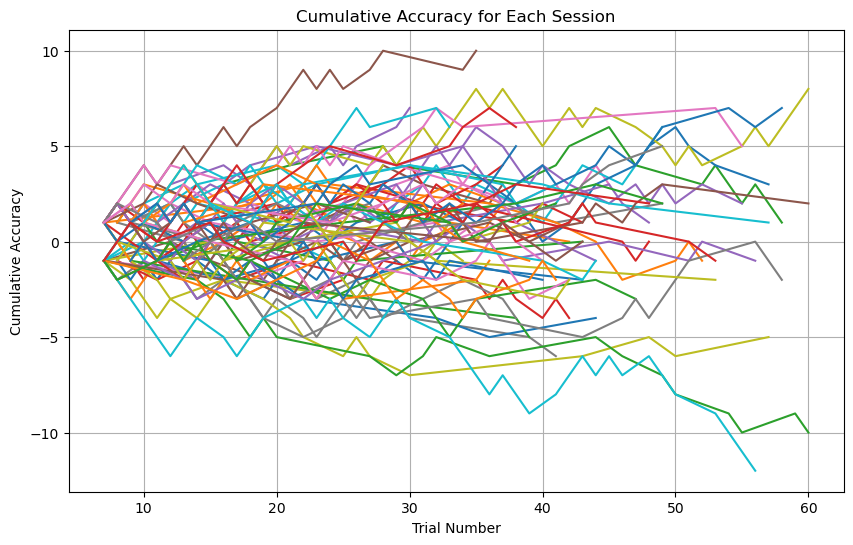

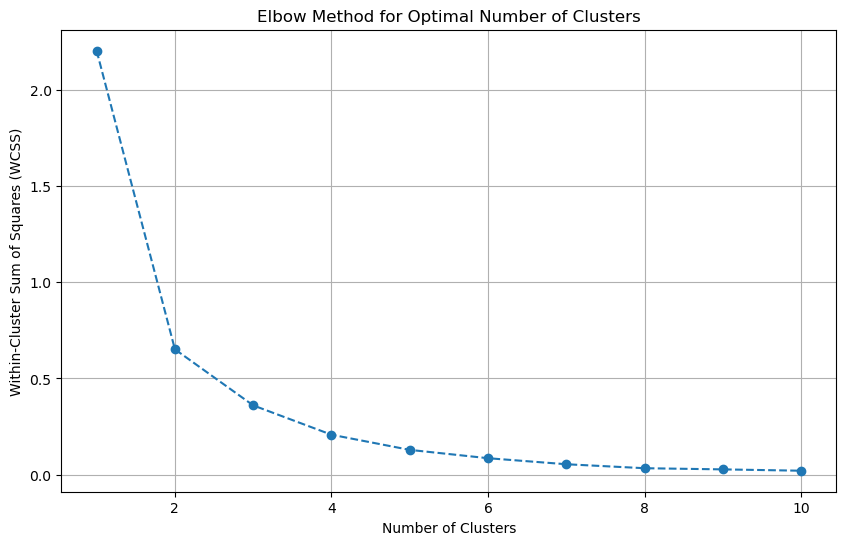

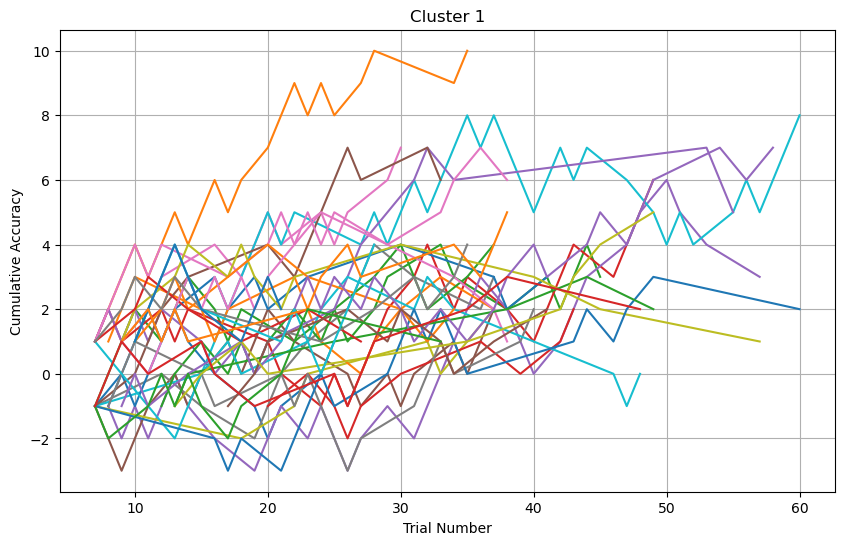

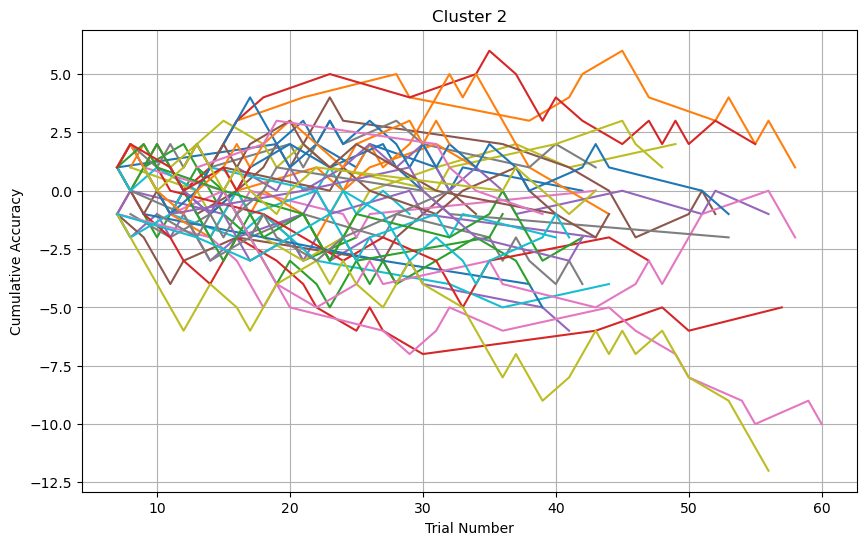

Cluster 1: curE002a, curE011a, curE012a, curE017a, curE018a, curE019a, curE027a, curE030a, curE032a, curE038a, curE039a, curE041a, curE045a, curE048a, curE049a, curE052a, curE063a, curE066a, curE067a, curE072a, curE075a, curE084a, curE086a, curE094a, curE106a, curE108a, curE109a, curE113a, curE114a, curE115a, curE118a, curE119a, curE121a, curE122a
Cluster 2: curE003a, curE004a, curE008a, curE009a, curE013a, curE014a, curE020a, curE024a, curE034a, curE040a, curE043a, curE046a, curE050a, curE051a, curE053a, curE054a, curE055a, curE056a, curE058a, curE062a, curE064a, curE069a, curE070a, curE071a, curE074a, curE076a, curE078a, curE079a, curE080a, curE082a, curE090a, curE092a, curE098a, curE099a, curE100a, curE104a, curE107a, curE111a, curE112a, curE120a


In [53]:
# Cumulative accuracy over trials for each session
# For each correct trial, it adds 1, and for each incorrect trial, it subtracts 1

warnings.filterwarnings("ignore")

cumulative_accuracy_data = []

for session, session_data in merged_filtered_data.groupby('session'):
    cumulative_accuracy = 0
    for index, trial in session_data.iterrows():
        if trial['accuracy'] == 1:
            cumulative_accuracy += 1
        else:
            cumulative_accuracy -= 1
        cumulative_accuracy_data.append({'session': session, 'trialno': trial['trialno'], 'cumulative_accuracy': cumulative_accuracy})

cumulative_accuracy_df = pd.DataFrame(cumulative_accuracy_data)

cumulative_accuracy_df = cumulative_accuracy_df[cumulative_accuracy_df['trialno'] <= 60]

plt.figure(figsize=(10, 6))
for session, session_data in cumulative_accuracy_df.groupby('session'):
    plt.plot(session_data['trialno'], session_data['cumulative_accuracy'], label=f'Session {session}')
plt.xlabel('Trial Number')
plt.ylabel('Cumulative Accuracy')
plt.title('Cumulative Accuracy for Each Session')
plt.grid(True)
plt.show()

# Slope for each session
slope_data = []

for session, session_data in cumulative_accuracy_df.groupby('session'):
    trial_numbers = session_data['trialno']
    cumulative_accuracies = session_data['cumulative_accuracy']
    slopes = np.diff(cumulative_accuracies) / np.diff(trial_numbers)
    avg_slope = np.mean(slopes)
    slope_data.append({'session': session, 'average_slope': avg_slope})

slope_df = pd.DataFrame(slope_data)

# Cluster babies according to their tendency

wcss = []
for num_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(slope_df[['average_slope']])
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.grid(True)
plt.show()

optimal_num_clusters = 2
kmeans = KMeans(n_clusters=optimal_num_clusters, random_state=42)
clusters = kmeans.fit_predict(slope_df[['average_slope']])

for i in range(optimal_num_clusters):
    plt.figure(figsize=(10, 6))
    cluster_sessions = slope_df[clusters == i]['session']
    for session in cluster_sessions:
        session_data = cumulative_accuracy_df[cumulative_accuracy_df['session'] == session]
        plt.plot(session_data['trialno'], session_data['cumulative_accuracy'], label=f'Session {session}')
    plt.xlabel('Trial Number')
    plt.ylabel('Cumulative Accuracy')
    plt.title(f'Cluster {i+1}')
    plt.grid(True)
    plt.show()

for i in range(optimal_num_clusters):
    sessions_in_cluster = slope_df.loc[clusters == i, 'session']
    print(f"Cluster {i+1}: {', '.join(map(str, sessions_in_cluster))}")

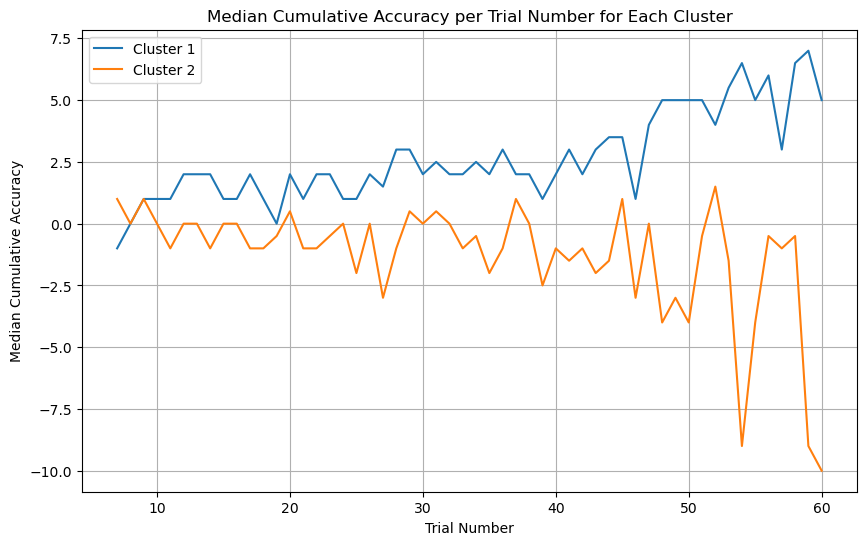


Cluster 1:
Shapiro-Wilk test p-value: 5.753274947020348e-10
Levene's test p-value: 7.1705213802395e-07
Kruskal-Wallis test p-value: 4.4551655480650585e-38

Cluster 2:
Shapiro-Wilk test p-value: 1.5166069796487995e-11
Levene's test p-value: 1.4919213379602657e-08
Kruskal-Wallis test p-value: 1.088583009714953e-71


In [13]:
# median cumulative accuracy per trialno for each cluster

clusters = {
    1: ['curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a', 'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a', 'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a', 'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a'],
    2: ['curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a', 'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a', 'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a', 'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a', 'curE107a', 'curE111a', 'curE112a', 'curE120a']
}

median_accuracy_per_cluster = {}
for cluster, sessions in clusters.items():
    cluster_data = cumulative_accuracy_df[cumulative_accuracy_df['session'].isin(sessions)]
    median_accuracy = cluster_data.groupby('trialno')['cumulative_accuracy'].median()
    median_accuracy_per_cluster[cluster] = median_accuracy

plt.figure(figsize=(10, 6))
for cluster, median_accuracy in median_accuracy_per_cluster.items():
    plt.plot(median_accuracy.index, median_accuracy.values, label=f'Cluster {cluster}')

plt.xlabel('Trial Number')
plt.ylabel('Median Cumulative Accuracy')
plt.title('Median Cumulative Accuracy per Trial Number for Each Cluster')
plt.legend()
plt.grid(True)
plt.show()

# Shapiro-Wilk, Levene, and Kruskal-Wallis tests for each cluster
for cluster, sessions in clusters.items():
    cluster_data = cumulative_accuracy_df[cumulative_accuracy_df['session'].isin(sessions)]
    print(f"\nCluster {cluster}:")
    # Shapiro-Wilk test for normality
    shapiro_test = stats.shapiro(cluster_data['cumulative_accuracy'])
    print(f"Shapiro-Wilk test p-value: {shapiro_test.pvalue}")

    # Levene's test for homogeneity of variances
    levene_test = stats.levene(*[group['cumulative_accuracy'] for name, group in cluster_data.groupby('session')])
    print(f"Levene's test p-value: {levene_test.pvalue}")

    # Kruskal-Wallis test for equality of distributions
    kruskal_test = stats.kruskal(*[group['cumulative_accuracy'] for name, group in cluster_data.groupby('session')])
    print(f"Kruskal-Wallis test p-value: {kruskal_test.pvalue}")


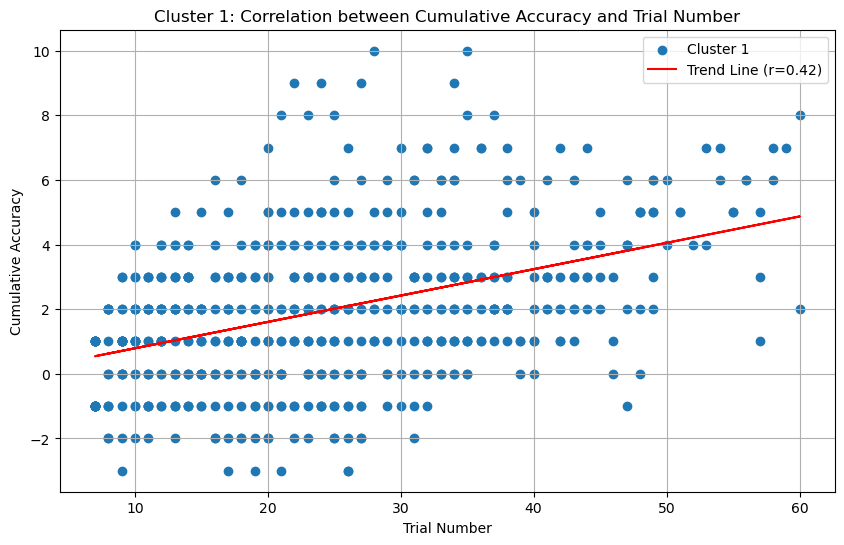

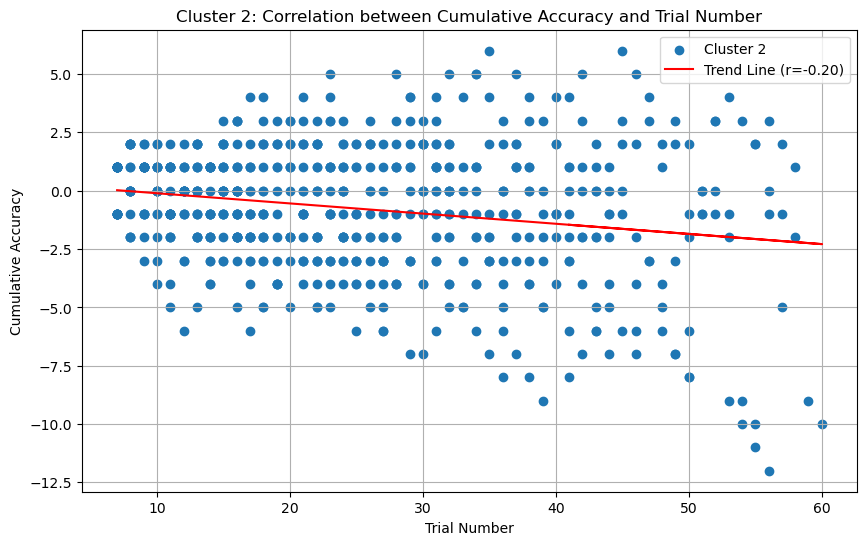

Cluster 1: Correlation coefficient (r) = 0.42
Cluster 2: Correlation coefficient (r) = -0.20


In [42]:
# Dispersion charts - Correlation between cumulative accuracy and trial number for each cluster

clusters = {
    1: ['curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a', 'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a', 'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a', 'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a'],
    2: ['curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a', 'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a', 'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a', 'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a', 'curE107a', 'curE111a', 'curE112a', 'curE120a']
}

# Scatter plots for each cluster showing correlation between cumulative accuracy and trial number
for cluster, sessions in clusters.items():
    cluster_data = cumulative_accuracy_df[cumulative_accuracy_df['session'].isin(sessions)]
    plt.figure(figsize=(10, 6))
    x = cluster_data['trialno']
    y = cluster_data['cumulative_accuracy']
    plt.scatter(x, y, label=f'Cluster {cluster}')
    # Add a trend line
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    plt.plot(x, intercept + slope*x, color='red', label=f'Trend Line (r={r_value:.2f})')

    plt.xlabel('Trial Number')
    plt.ylabel('Cumulative Accuracy')
    plt.title(f'Cluster {cluster}: Correlation between Cumulative Accuracy and Trial Number')
    plt.legend()
    plt.grid(True)
    plt.show()

# Pearson Correlation coefficient (r) for each cluster
for cluster, sessions in clusters.items():
    cluster_data = cumulative_accuracy_df[cumulative_accuracy_df['session'].isin(sessions)]
    x = cluster_data['trialno']
    y = cluster_data['cumulative_accuracy']
    correlation_coefficient = stats.pearsonr(x, y)[0]  # Pearson correlation coefficient
    print(f"Cluster {cluster}: Correlation coefficient (r) = {correlation_coefficient:.2f}")

In [95]:
# New column called cumulative accuracy
# For each correct trial, it adds 1, and for each incorrect trial, it subtracts 1

merged_filtered_data['cumulative_accuracy'] = 0

for session, session_data in merged_filtered_data.groupby('session'):
    cumulative_accuracy = 0
    for index, trial in session_data.iterrows():
        if index == session_data.index[0]:
            cumulative_accuracy = 0  
        if trial['accuracy'] == 1:
            cumulative_accuracy += 1
        else:
            cumulative_accuracy -= 1
        merged_filtered_data.at[index, 'cumulative_accuracy'] = cumulative_accuracy

pd.set_option('display.max_rows', None)

merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,FixTotDurInT,durExplorationPeriod_change,durDecisionPeriod_change,durPeriodTotal_change,SwitchesExplorationPeriod_change,FixNbInTDecision_change,FixNbInBottomExploration_change,FixDurInTDecision_change,durfixBottomExploration_change,cumulative_accuracy
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,1148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,1942,-8772.0,1258.0,-7514.0,-4.0,2.0,-13.0,1168.0,-3484.0,0
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,1774,7414.0,732.0,8146.0,1.0,0.0,3.0,-668.0,1078.0,1
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,1540,-7584.0,-1332.0,-8916.0,-1.0,0.0,-5.0,-152.0,-1586.0,2
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,1210,11944.0,-598.0,11346.0,3.0,-2.0,18.0,-240.0,6088.0,1
5,curE002a,13,Medium,1.0,left,15846,13628.0,2218.0,7,6.0,...,2516,-644.0,1234.0,590.0,1.0,4.0,-5.0,732.0,-830.0,2
6,curE002a,14,Medium,0.0,left,6926,5326.0,1600.0,3,3.0,...,1292,-8302.0,-618.0,-8920.0,-3.0,-3.0,-7.0,-144.0,-3268.0,1
7,curE002a,16,Medium,0.0,left,4478,2328.0,2150.0,1,1.0,...,1598,-2998.0,550.0,-2448.0,-2.0,0.0,-5.0,-346.0,-2004.0,0
8,curE002a,19,Medium,0.0,left,7128,5928.0,1200.0,2,2.0,...,690,3600.0,-950.0,2650.0,1.0,0.0,-1.0,-216.0,394.0,-1
9,curE002a,20,Medium,0.0,right,9080,3648.0,5432.0,4,3.0,...,3808,-2280.0,4232.0,1952.0,1.0,6.0,5.0,2738.0,922.0,-2


In [13]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: Cumulative Accuracy
# Distribution: beta
#Trial number as continuous variable
#Linear

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_cumulative_accuracy'] = scaler.fit_transform(merged_filtered_data[['cumulative_accuracy']]) #transforming cumulative_accuracy to fit into (0, 1) range 

formula = 'scaled_cumulative_accuracy ~ trialno + (1 + trialno | session)' # random intercept and slope 

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session']
)
result = mixed_model.fit()

print(result.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_cumulative_accuracy
No. Observations: 1211    Method:             REML                      
No. Groups:       74      Scale:              0.0052                    
Min. group size:  5       Log-Likelihood:     1315.5466                 
Max. group size:  40      Converged:          Yes                       
Mean group size:  16.4                                                  
--------------------------------------------------------------------------
                       Coef.   Std.Err.     z      P>|z|   [0.025   0.975]
--------------------------------------------------------------------------
Intercept              0.480      0.015   31.622   0.000    0.450    0.510
trialno                0.000      0.000    0.380   0.704   -0.000    0.001
trialno | session      0.002      0.000    7.539   0.000    0.001    0.002
Group Var              0.011      0.027                  

In [14]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: Cumulative Accuracy
# Distribution: beta
#Trial number as continuous variable
# Non-linear: quadratic transformation

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_cumulative_accuracy'] = scaler.fit_transform(merged_filtered_data[['cumulative_accuracy']]) #transforming cumulative_accuracy to fit into (0, 1) range 

formula = 'scaled_cumulative_accuracy ~ trialno + np.power (trialno, 2) + (1 + trialno | session)' #accounting for non-linear trend here # random intercept and slope 

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session']
)
result = mixed_model.fit()

print(result.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_cumulative_accuracy
No. Observations: 1211    Method:             REML                      
No. Groups:       74      Scale:              0.0053                    
Min. group size:  5       Log-Likelihood:     1304.9579                 
Max. group size:  40      Converged:          Yes                       
Mean group size:  16.4                                                  
-------------------------------------------------------------------------
                          Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------------------
Intercept                  0.485     0.017  28.193  0.000   0.452   0.519
trialno                   -0.000     0.001  -0.433  0.665  -0.001   0.001
np.power(trialno, 2)       0.000     0.000   0.656  0.512  -0.000   0.000
trialno | session          0.002     0.000   7.214  0.000   0.0

In [15]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: Cumulative Accuracy
# Distribution: beta
#Trial number as continuous variable
# Non-linear: square root transformation

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_cumulative_accuracy'] = scaler.fit_transform(merged_filtered_data[['cumulative_accuracy']]) #transforming cumulative_accuracy to fit into (0, 1) range 

formula = 'scaled_cumulative_accuracy ~ trialno + np.power(trialno, 0.5) + (1 + trialno | session)' #accounting for non-linear trend here # random intercept and slope 

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session']
)
result = mixed_model.fit()

print(result.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_cumulative_accuracy
No. Observations: 1211    Method:             REML                      
No. Groups:       74      Scale:              0.0053                    
Min. group size:  5       Log-Likelihood:     1311.9619                 
Max. group size:  40      Converged:          Yes                       
Mean group size:  16.4                                                  
-------------------------------------------------------------------------
                          Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------------------
Intercept                  0.488     0.031  15.736  0.000   0.427   0.548
trialno                    0.000     0.001   0.356  0.722  -0.002   0.002
np.power(trialno, 0.5)    -0.003     0.011  -0.283  0.777  -0.024   0.018
trialno | session          0.002     0.000   7.410  0.000   0.0

In [25]:
# Akaike Information Criterion to check for fitness of the models

def calculate_aic(n_params, log_likelihood):
    return 2 * n_params - 2 * log_likelihood

model_params = [3, 4, 4] 
model_log_likelihood = [1315.5466, 1304.9579 , 1311.9619] 

model_aic = [calculate_aic(params, ll) for params, ll in zip(model_params, model_log_likelihood)]

best_model_index = np.argmin(model_aic)

for i, aic in enumerate(model_aic):
    print(f"Model {i+1} AIC: {aic}")

print(f"\nThe best model is Model {best_model_index+1} with AIC: {model_aic[best_model_index]}")

Model 1 AIC: -2625.0932
Model 2 AIC: -2601.9158
Model 3 AIC: -2615.9238

The best model is Model 1 with AIC: -2625.0932


In [105]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 1 
# Distribution: Log-normal
#Trial number as continuous variable
# Linear

sessions_cluster_1 = ['curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a', 'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a', 'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a', 'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a']
data_cluster_1 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_1)].copy()

min_value = np.min(data_cluster_1['cumulative_accuracy'])
epsilon = 1e-6  
data_cluster_1['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_1['log_cumulative_accuracy'] = np.log(data_cluster_1['cumulative_accuracy'])
data_cluster_1['session'] = data_cluster_1['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
data_cluster_1[['log_cumulative_accuracy']] = scaler.fit_transform(data_cluster_1[['log_cumulative_accuracy']]) # it follows a log-normal distribution

formula = 'log_cumulative_accuracy ~ trialno + (1 + trialno | session)' #Random intercept and random slope 

mixed_model = smf.mixedlm(formula, data = data_cluster_1, groups=data_cluster_1['session'])
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_1['log_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_cumulative_accuracy
No. Observations: 579     Method:             REML                   
No. Groups:       34      Scale:              0.0086                 
Min. group size:  6       Log-Likelihood:     521.9800               
Max. group size:  39      Converged:          Yes                    
Mean group size:  17.0                                               
-----------------------------------------------------------------------
                    Coef.   Std.Err.     z      P>|z|   [0.025   0.975]
-----------------------------------------------------------------------
Intercept           0.876      0.012   76.084   0.000    0.853    0.898
trialno             0.001      0.001    2.041   0.041    0.000    0.002
trialno | session   0.001      0.001    1.173   0.241   -0.000    0.002
Group Var           0.001      0.004                                   

Mean Absolute Error (

In [103]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 1 
# Distribution: Log-normal
#Trial number as continuous variable
# Non-linear: quadratic transformation

sessions_cluster_1 = ['curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a', 'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a', 'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a', 'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a']
data_cluster_1 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_1)].copy()

min_value = np.min(data_cluster_1['cumulative_accuracy'])
epsilon = 1e-6  
data_cluster_1['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_1['log_cumulative_accuracy'] = np.log(data_cluster_1['cumulative_accuracy'])
data_cluster_1['session'] = data_cluster_1['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
data_cluster_1[['log_cumulative_accuracy']] = scaler.fit_transform(data_cluster_1[['log_cumulative_accuracy']]) # it follows a log-normal distribution

formula = 'log_cumulative_accuracy ~ trialno + np.power(trialno, 2) + (1 + trialno | session)' #Random intercept and random slope 

mixed_model = smf.mixedlm(formula, data = data_cluster_1, groups=data_cluster_1['session'])
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_1['log_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_cumulative_accuracy
No. Observations: 579     Method:             REML                   
No. Groups:       34      Scale:              0.0086                 
Min. group size:  6       Log-Likelihood:     511.7833               
Max. group size:  39      Converged:          Yes                    
Mean group size:  17.0                                               
----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|  [0.025  0.975]
----------------------------------------------------------------------
Intercept               0.883     0.016  55.978  0.000   0.852   0.914
trialno                 0.001     0.001   0.685  0.493  -0.001   0.003
np.power(trialno, 2)    0.000     0.000   0.697  0.486  -0.000   0.000
trialno | session       0.001     0.001   1.147  0.251  -0.000   0.002
Group Var               0.001

In [102]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 1 
# Distribution: Log-normal
#Trial number as continuous variable
# Non-linear: square root transformation

sessions_cluster_1 = ['curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a', 'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a', 'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a', 'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a']
data_cluster_1 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_1)].copy()

min_value = np.min(data_cluster_1['cumulative_accuracy'])
epsilon = 1e-6  
data_cluster_1['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_1['log_cumulative_accuracy'] = np.log(data_cluster_1['cumulative_accuracy'])
data_cluster_1['session'] = data_cluster_1['session'].astype('category').cat.codes
data_cluster_1['trialno'] = data_cluster_1['trialno'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
data_cluster_1[['log_cumulative_accuracy']] = scaler.fit_transform(data_cluster_1[['log_cumulative_accuracy']]) # it follows a log-normal distribution

formula = 'log_cumulative_accuracy ~ trialno + np.power(trialno, 0.5) + (1 + trialno | session)' #Random intercept and random slope 

mixed_model = smf.mixedlm(formula, data = data_cluster_1, groups=data_cluster_1['session'])
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_1['log_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_cumulative_accuracy
No. Observations: 579     Method:             REML                   
No. Groups:       34      Scale:              0.0086                 
Min. group size:  6       Log-Likelihood:     517.8968               
Max. group size:  39      Converged:          Yes                    
Mean group size:  17.0                                               
---------------------------------------------------------------------
                           Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------
Intercept                   0.912    0.020 46.450 0.000  0.873  0.950
trialno                     0.003    0.001  2.473 0.013  0.001  0.006
np.power(trialno, 0.5)     -0.010    0.008 -1.172 0.241 -0.026  0.007
trialno | session          -0.000    0.001 -0.093 0.926 -0.001  0.001
Group Var                   0.001   

In [26]:
# Akaike Information Criterion to check for fitness of the models

def calculate_aic(n_params, log_likelihood):
    return 2 * n_params - 2 * log_likelihood

model_params = [3, 4, 4] 
model_log_likelihood = [521.9800, 511.7833 , 517.8968] 

model_aic = [calculate_aic(params, ll) for params, ll in zip(model_params, model_log_likelihood)]

best_model_index = np.argmin(model_aic)

for i, aic in enumerate(model_aic):
    print(f"Model {i+1} AIC: {aic}")

print(f"\nThe best model is Model {best_model_index+1} with AIC: {model_aic[best_model_index]}")

Model 1 AIC: -1037.96
Model 2 AIC: -1015.5666
Model 3 AIC: -1027.7936

The best model is Model 1 with AIC: -1037.96


In [111]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 2
# Distribution: weibull
#Trial number as continuous variable
# Linear

sessions_cluster_2 = ['curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a', 'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a', 'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a', 'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a', 'curE107a', 'curE111a', 'curE112a', 'curE120a']
data_cluster_2 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_2)].copy()

data_cluster_2['session'] = data_cluster_2['session'].astype('category').cat.codes

min_value = np.min(data_cluster_2['cumulative_accuracy'])
epsilon = 1e-6  # small constant to avoid zero
data_cluster_2['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_2['transformed_cumulative_accuracy'] = np.log(data_cluster_2['cumulative_accuracy'] + 0.001) # Transform cumulative accuracy to fit a Weibull distribution

#scaler = StandardScaler()
#data_cluster_2['scaled_transformed_cumulative_accuracy'] = scaler.fit_transform(data_cluster_2[['transformed_cumulative_accuracy']])

formula = 'transformed_cumulative_accuracy ~ trialno + (1 + trialno | session)' #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=data_cluster_2, groups=data_cluster_2['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_2['transformed_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                    Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_cumulative_accuracy
No. Observations: 632     Method:             REML                           
No. Groups:       40      Scale:              0.1489                         
Min. group size:  5       Log-Likelihood:     -342.0078                      
Max. group size:  40      Converged:          Yes                            
Mean group size:  15.8                                                       
--------------------------------------------------------------------------------
                       Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------
Intercept               2.577       0.057    45.406    0.000     2.466     2.688
trialno                -0.009       0.002    -4.567    0.000    -0.013    -0.005
trialno | session       0.001       0.002     0.603    0.547    -0.00

In [112]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 2
# Distribution: weibull
#Trial number as continuous variable
# Non-linear: quadratic transformation

sessions_cluster_2 = ['curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a', 'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a', 'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a', 'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a', 'curE107a', 'curE111a', 'curE112a', 'curE120a']
data_cluster_2 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_2)].copy()

data_cluster_2['session'] = data_cluster_2['session'].astype('category').cat.codes

min_value = np.min(data_cluster_2['cumulative_accuracy'])
epsilon = 1e-6  # small constant to avoid zero
data_cluster_2['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_2['transformed_cumulative_accuracy'] = np.log(data_cluster_2['cumulative_accuracy'] + 0.001) # Transform cumulative accuracy to fit a Weibull distribution

scaler = StandardScaler()
data_cluster_2['scaled_transformed_cumulative_accuracy'] = scaler.fit_transform(data_cluster_2[['transformed_cumulative_accuracy']])

formula = 'transformed_cumulative_accuracy ~ trialno + np.power(trialno, 2) + (1 + trialno | session)' #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=data_cluster_2, groups=data_cluster_2['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_2['transformed_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                    Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_cumulative_accuracy
No. Observations: 632     Method:             REML                           
No. Groups:       40      Scale:              0.1444                         
Min. group size:  5       Log-Likelihood:     -340.9024                      
Max. group size:  40      Converged:          Yes                            
Mean group size:  15.8                                                       
-------------------------------------------------------------------------------
                           Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                   2.305      0.084   27.573   0.000    2.141    2.469
trialno                     0.012      0.005    2.347   0.019    0.002    0.023
np.power(trialno, 2)       -0.000      0.000   -4.398   0.000   -0.001   -

In [113]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: cumulative accuracy, cluster 2
# Distribution: weibull
#Trial number as continuous variable
# Non-linear: sqaure root transformation

sessions_cluster_2 = ['curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a', 'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a', 'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a', 'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a', 'curE107a', 'curE111a', 'curE112a', 'curE120a']
data_cluster_2 = merged_filtered_data[merged_filtered_data['session'].isin(sessions_cluster_2)].copy()

data_cluster_2['session'] = data_cluster_2['session'].astype('category').cat.codes

min_value = np.min(data_cluster_2['cumulative_accuracy'])
epsilon = 1e-6  # small constant to avoid zero
data_cluster_2['cumulative_accuracy'] += abs(min_value) + epsilon

data_cluster_2['transformed_cumulative_accuracy'] = np.log(data_cluster_2['cumulative_accuracy'] + 0.001) # Transform cumulative accuracy to fit a Weibull distribution

scaler = StandardScaler()
data_cluster_2['scaled_transformed_cumulative_accuracy'] = scaler.fit_transform(data_cluster_2[['transformed_cumulative_accuracy']])

formula = 'transformed_cumulative_accuracy ~ trialno + np.power(trialno, 0.5) + (1 + trialno | session)' #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=data_cluster_2, groups=data_cluster_2['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = data_cluster_2['transformed_cumulative_accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                    Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_cumulative_accuracy
No. Observations: 632     Method:             REML                           
No. Groups:       40      Scale:              0.1465                         
Min. group size:  5       Log-Likelihood:     -338.0958                      
Max. group size:  40      Converged:          Yes                            
Mean group size:  15.8                                                       
-------------------------------------------------------------------------------
                           Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                   1.845      0.229    8.045   0.000    1.396    2.295
trialno                    -0.040      0.010   -4.176   0.000   -0.059   -0.021
np.power(trialno, 0.5)      0.304      0.092    3.291   0.001    0.123    

In [27]:
# Akaike Information Criterion to check for fitness of the models

def calculate_aic(n_params, log_likelihood):
    return 2 * n_params - 2 * log_likelihood

model_params = [3, 4, 4] 
model_log_likelihood = [1093.4299, 1092.2532 , 1095.0598] 

model_aic = [calculate_aic(params, ll) for params, ll in zip(model_params, model_log_likelihood)]

best_model_index = np.argmin(model_aic)

for i, aic in enumerate(model_aic):
    print(f"Model {i+1} AIC: {aic}")

print(f"\nThe best model is Model {best_model_index+1} with AIC: {model_aic[best_model_index]}")

Model 1 AIC: -2180.8598
Model 2 AIC: -2176.5064
Model 3 AIC: -2182.1196

The best model is Model 3 with AIC: -2182.1196


In [46]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy
# Distribution: binomial

merged_filtered_data['trialno'] = merged_filtered_data['trialno'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

formula = 'accuracy ~ np.power(trialno, 2) + (trialno | session)'

#LOO cross-validation
#def loo_cv(model, formula, data):
#    mae_scores = []
#    n = len(data)
#    data.reset_index(drop=True, inplace=True)  # Reset index
#    for i in range(n):
#        train_data = data.drop(index=i)
#        test_data = data.iloc[[i]]
#        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
#        result = model_fit.fit()
#        predicted_value = result.predict(test_data)
#        true_value = test_data['accuracy'].values[0]
#        mae_scores.append(np.abs(predicted_value - true_value))
#    return np.mean(mae_scores)

# Fit the mixed effects model
mixed_model = sm.MixedLM.from_formula(formula, groups=merged_filtered_data['session'], data=merged_filtered_data)

# Fit the model
result= mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = merged_filtered_data['accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

             Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   accuracy 
No. Observations:     1211      Method:               REML     
No. Groups:           74        Scale:                0.2483   
Min. group size:      5         Log-Likelihood:       -896.5006
Max. group size:      40        Converged:            Yes      
Mean group size:      16.4                                     
---------------------------------------------------------------
                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------
Intercept             0.527    0.035 14.860 0.000  0.458  0.597
np.power(trialno, 2) -0.000    0.000 -0.002 0.998 -0.000  0.000
trialno | session    -0.000    0.001 -0.185 0.853 -0.002  0.001
Group Var             0.003    0.009                           

Mean Absolute Error (MAE): 0.49908990741338927
Mean Squared Error (MSE): 0.24954766346296695


In [32]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy - cluster 1
# Distribution: binomial

data_cluster_1['trialno'] = data_cluster_1['trialno'].astype('category').cat.codes
data_cluster_1['session'] = data_cluster_1['session'].astype('category').cat.codes

formula = 'accuracy ~ np.power(trialno, 0.5) + (trialno | session)'

#LOO cross-validation
#def loo_cv(model, formula, data):
#    mae_scores = []
#    n = len(data)
#    data.reset_index(drop=True, inplace=True)  # Reset index
#    for i in range(n):
#        train_data = data.drop(index=i)
#        test_data = data.iloc[[i]]
#        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
#        result = model_fit.fit()
#        predicted_value = result.predict(test_data)
#        true_value = test_data['accuracy'].values[0]
#        mae_scores.append(np.abs(predicted_value - true_value))
#    return np.mean(mae_scores)

# Fit the mixed effects model
mixed_model = sm.MixedLM.from_formula(formula, groups=data_cluster_1['session'], data=data_cluster_1)

# Fit the model
result= mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data_cluster_1)

predicted_values = result.predict()

observed_values = data_cluster_1['accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                     Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         accuracy
No. Observations:          579             Method:                     REML    
No. Groups:                34              Scale:                      0.2366  
Min. group size:           6               Log-Likelihood:             inf     
Max. group size:           39              Converged:                  Yes     
Mean group size:           17.0                                                
-------------------------------------------------------------------------------
                       Coef.    Std.Err.    z    P>|z|    [0.025       0.975]  
-------------------------------------------------------------------------------
Intercept              -0.000 3987965.717 -0.000 1.000 -7816269.176 7816269.176
np.power(trialno, 0.5) -0.015       0.022 -0.662 0.508       -0.058       0.029
trialno | session       0.002       0.003  0.851 0.395       

In [33]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy - cluster 2
# Distribution: binomial

data_cluster_2['trialno'] = data_cluster_2['trialno'].astype('category').cat.codes
data_cluster_2['session'] = data_cluster_2['session'].astype('category').cat.codes

formula = 'accuracy ~ trialno + np.power(trialno, 2) + (trialno | session)'

#LOO cross-validation
#def loo_cv(model, formula, data):
#    mae_scores = []
#    n = len(data)
#    data.reset_index(drop=True, inplace=True)  # Reset index
#    for i in range(n):
#        train_data = data.drop(index=i)
#        test_data = data.iloc[[i]]
#        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
#        result = model_fit.fit()
#        predicted_value = result.predict(test_data)
#        true_value = test_data['accuracy'].values[0]
#        mae_scores.append(np.abs(predicted_value - true_value))
#    return np.mean(mae_scores)

# Fit the mixed effects model
mixed_model = sm.MixedLM.from_formula(formula, groups=data_cluster_2['session'], data=data_cluster_2)

# Fit the model
result= mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data_cluster_2)

predicted_values = result.predict()

observed_values = data_cluster_2['accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

             Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   accuracy 
No. Observations:     632       Method:               REML     
No. Groups:           40        Scale:                0.2461   
Min. group size:      5         Log-Likelihood:       -475.4553
Max. group size:      40        Converged:            No       
Mean group size:      15.8                                     
---------------------------------------------------------------
                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------
Intercept             0.468    0.047 10.051 0.000  0.376  0.559
trialno              -0.003    0.002 -1.507 0.132 -0.007  0.001
np.power(trialno, 2)  0.000    0.000  1.000 0.317 -0.000  0.001
trialno | session     0.001    0.002  0.606 0.544 -0.002  0.005
Group Var             0.002                                    

Mean Absolute Error (MAE): 0.4907504081131743
Mean S

In [12]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durPeriodTotal
# Distribution: Weibull 

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durPeriodTotal'] = np.log(merged_filtered_data['durPeriodTotal'] + 0.001) # Transform trial duration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_durPeriodTotal'] = scaler.fit_transform(merged_filtered_data[['transformed_durPeriodTotal']])

formula = 'scaled_transformed_durPeriodTotal ~ trialno + np.power(trialno, 2) + (trialno | session)' # Quadratic term for trialno (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_durPeriodTotal']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                     Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durPeriodTotal
No. Observations: 1211    Method:             REML                             
No. Groups:       74      Scale:              0.0454                           
Min. group size:  5       Log-Likelihood:     73.0643                          
Max. group size:  40      Converged:          Yes                              
Mean group size:  16.4                                                         
----------------------------------------------------------------------------------
                         Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
----------------------------------------------------------------------------------
Intercept                 0.414       0.033    12.628    0.000     0.349     0.478
trialno                   0.002       0.002     1.160    0.246    -0.001     0.005
np.power(trialno, 2)     -0.000       0.000   

In [31]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

durExplorationPeriod_2d = merged_filtered_data['durExplorationPeriod'].values.reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_durExplorationPeriod'] = scaler.fit_transform(durExplorationPeriod_2d)

formula = 'scaled_durExplorationPeriod ~ trialno + np.power(trialno, 0.5) + (trialno | session)' #non-linear trend #random intercept and random slope

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session']
)
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_durExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                  Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_durExplorationPeriod
No. Observations: 1211    Method:             REML                       
No. Groups:       74      Scale:              0.0493                     
Min. group size:  5       Log-Likelihood:     39.9914                    
Max. group size:  40      Converged:          Yes                        
Mean group size:  16.4                                                   
--------------------------------------------------------------------------
                           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
--------------------------------------------------------------------------
Intercept                   0.224     0.083   2.709  0.007   0.062   0.387
trialno                     0.003     0.003   0.905  0.366  -0.003   0.009
np.power(trialno, 0.5)     -0.015     0.032  -0.479  0.632  -0.078   0.047
trialno | session          -0.000     0.000  -0.10

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [28]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durDecisionPeriod
# Distribution: Log-normal

merged_filtered_data['log_durDecisionPeriod'] = np.log(merged_filtered_data['durDecisionPeriod'])
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = StandardScaler() 
merged_filtered_data[['log_durDecisionPeriod']] = scaler.fit_transform(merged_filtered_data[['log_durDecisionPeriod']]) # Decision period duration follows a log-normal distribution

formula = 'log_durDecisionPeriod ~ trialno + np.power(trialno, 0.5) + (trialno | session)' #Random intercept and random slope #Also accounting for non-linear trend

mixed_model = smf.mixedlm(formula, merged_filtered_data, groups=merged_filtered_data['session'])
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['log_durDecisionPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

               Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_durDecisionPeriod
No. Observations: 1211    Method:             REML                 
No. Groups:       74      Scale:              0.8359               
Min. group size:  5       Log-Likelihood:     -1672.6014           
Max. group size:  40      Converged:          Yes                  
Mean group size:  16.4                                             
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                -0.163    0.344 -0.475 0.635 -0.836  0.510
trialno                  -0.005    0.013 -0.362 0.717 -0.030  0.021
np.power(trialno, 0.5)    0.104    0.132  0.790 0.430 -0.154  0.362
trialno | session        -0.003    0.002 -1.675 0.094 -0.008  0.001
Group Var                 0.165    0.042                       

In [27]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durfixBottomExploration
# Distribution: gamma

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

shape, loc, scale = gamma.fit(merged_filtered_data['durfixBottomExploration'])

merged_filtered_data['transformed_durfixBottomExploration'] = gamma.cdf(merged_filtered_data['durfixBottomExploration'], shape, loc=loc, scale=scale)

scaler = StandardScaler() 
merged_filtered_data[['scaled_transformed_durfixBottomExploration']] = scaler.fit_transform(merged_filtered_data[['transformed_durfixBottomExploration']])

formula = 'scaled_transformed_durfixBottomExploration ~ trialno + np.power(trialno, 2) + (trialno | session)' # accounting for non linear trend #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_durfixBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durfixBottomExploration
No. Observations: 1211    Method:             REML                                      
No. Groups:       74      Scale:              0.7933                                    
Min. group size:  5       Log-Likelihood:     -1653.9782                                
Max. group size:  40      Converged:          Yes                                       
Mean group size:  16.4                                                                  
---------------------------------------------------------------------------------------------
                          Coef.       Std.Err.        z         P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                  0.243         0.138       1.764      0.078      -0.027       0.514
trialno                   -

In [26]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixDurInTDecision
# Distribution: Weibull 

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixDurInTDecision'] = np.log(merged_filtered_data['FixDurInTDecision'] + 0.001) # Transform FixDurInTDecision to fit a Weibull distribution
FixDurInTDecision_2d = merged_filtered_data['transformed_FixDurInTDecision'].values.reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_FixDurInTDecision'] = scaler.fit_transform(FixDurInTDecision_2d)

formula = 'scaled_transformed_FixDurInTDecision ~ trialno + np.power(trialno, 0.5) + (trialno | session)' # Accounting for non-linearity #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixDurInTDecision
No. Observations: 1211    Method:             REML                                
No. Groups:       74      Scale:              0.0499                              
Min. group size:  5       Log-Likelihood:     64.0985                             
Max. group size:  40      Converged:          Yes                                 
Mean group size:  16.4                                                            
-------------------------------------------------------------------------------------
                            Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
-------------------------------------------------------------------------------------
Intercept                    0.951       0.079    11.982    0.000     0.795     1.106
trialno                      0.004       0.003     1.407    0.159    -0.002     0.010
np.power(tri

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [27]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

merged_filtered_data['trialno'] = merged_filtered_data['trialno'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_FixNb'] = scaler.fit_transform(merged_filtered_data[['FixNb']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_FixNb ~ trialno + np.power(trialno, 0.5) + (trialno | session)' #accounting for non-linear trend here  # random intercept and slope 

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True) 
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_FixNb'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)
    
mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session'], 
)
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_FixNb']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

              Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   scaled_FixNb
No. Observations:    1211      Method:               REML        
No. Groups:          74        Scale:                0.0165      
Min. group size:     5         Log-Likelihood:       692.3671    
Max. group size:     40        Converged:            Yes         
Mean group size:     16.4                                        
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept               0.289    0.021 14.033 0.000  0.248  0.329
trialno                 0.002    0.001  1.654 0.098 -0.000  0.004
np.power(trialno, 0.5) -0.010    0.008 -1.233 0.217 -0.026  0.006
trialno | session      -0.001    0.000 -1.684 0.092 -0.001  0.000
Group Var               0.004    0.007                           

Mean Absolute Error (MA

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [21]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbInBottomExploration
# Distribution: Weibull 

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixNbInBottomExploration'] = np.log(merged_filtered_data['FixNbInBottomExploration'] + 0.001) # Transform FixNbInBottomExploration to fit a Weibull distribution

scaler = StandardScaler() 
merged_filtered_data[['scaled_transformed_FixNbInBottomExploration']] = scaler.fit_transform(merged_filtered_data[['transformed_FixNbInBottomExploration']])

formula = 'scaled_transformed_FixNbInBottomExploration ~ trialno + np.power(trialno, 0.5) + (trialno | session)' # Accounting for non-linear trend #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixNbInBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbInBottomExploration
No. Observations: 1211    Method:             REML                                       
No. Groups:       74      Scale:              0.7008                                     
Min. group size:  5       Log-Likelihood:     -1588.4104                                 
Max. group size:  40      Converged:          Yes                                        
Mean group size:  16.4                                                                   
---------------------------------------------------------------------------------------------
                               Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
---------------------------------------------------------------------------------------------
Intercept                       0.603        0.325      1.856     0.063     -0.034      1.239
trialno             

In [19]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbTD
# Distribution: gamma

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

# Fit a gamma distribution to cumulative_accuracy
shape, loc, scale = gamma.fit(merged_filtered_data['FixNbInTDecision'])

# Transform FixNbTD to fit a gamma distribution
merged_filtered_data['transformed_FixNbInTDecision'] = gamma.cdf(merged_filtered_data['FixNbInTDecision'], shape, loc=loc, scale=scale)

scaler = StandardScaler() 
merged_filtered_data[['scaled_transformed_FixNbInTDecision']] = scaler.fit_transform(merged_filtered_data[['transformed_FixNbInTDecision']])

formula = 'scaled_transformed_FixNbInTDecision ~ trialno + np.power(trialno, 2) + (trialno | session)' # Quadratic term for trialno (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixNbInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbInTDecision
No. Observations: 1211    Method:             REML                               
No. Groups:       74      Scale:              0.9161                             
Min. group size:  5       Log-Likelihood:     -1708.2593                         
Max. group size:  40      Converged:          Yes                                
Mean group size:  16.4                                                           
------------------------------------------------------------------------------------
                           Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
------------------------------------------------------------------------------------
Intercept                   0.426       0.349     1.221    0.222    -0.258     1.110
trialno                     0.010       0.013     0.750    0.453    -0.016     0.036
np.power(trialno, 0.5) 

In [17]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: SwitchesExplorationPeriod
# Distribution: gamma

merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

shape, loc, scale = gamma.fit(merged_filtered_data['SwitchesExplorationPeriod'])

merged_filtered_data['transformed_SwitchesExplorationPeriod'] = gamma.cdf(merged_filtered_data['SwitchesExplorationPeriod'], shape, loc=loc, scale=scale)

scaler = StandardScaler() 
merged_filtered_data[['scaled_transformed_SwitchesExplorationPeriod']] = scaler.fit_transform(merged_filtered_data[['SwitchesExplorationPeriod']])

formula = 'scaled_transformed_SwitchesExplorationPeriod ~ trialno + np.power(trialno, 2) + (trialno | session)' # Quadratic term for trialno (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_SwitchesExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_SwitchesExplorationPeriod
No. Observations: 1211    Method:             REML                                        
No. Groups:       74      Scale:              0.8191                                      
Min. group size:  5       Log-Likelihood:     -1671.6275                                  
Max. group size:  40      Converged:          Yes                                         
Mean group size:  16.4                                                                    
-----------------------------------------------------------------------------------------------
                            Coef.       Std.Err.        z         P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                    0.090         0.139       0.646      0.518      -0.182       0.362
trialn

## Analysis of other variables of interest

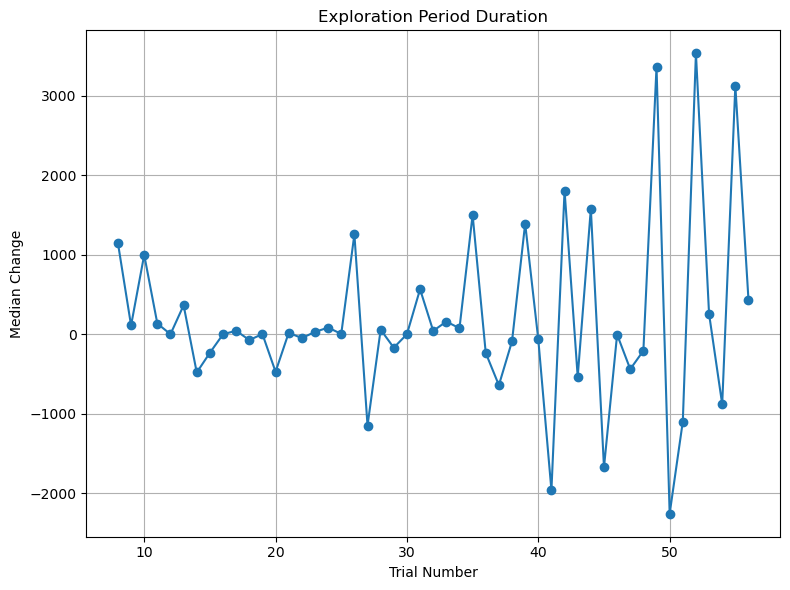

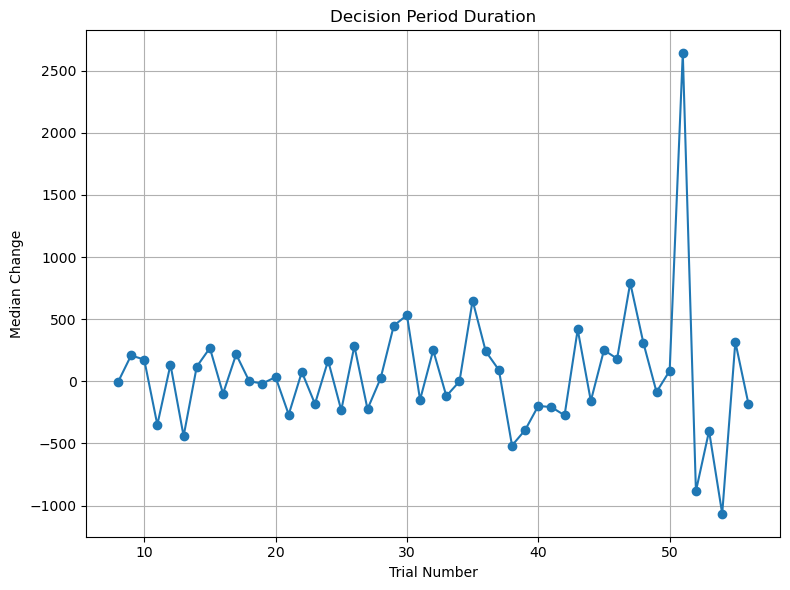

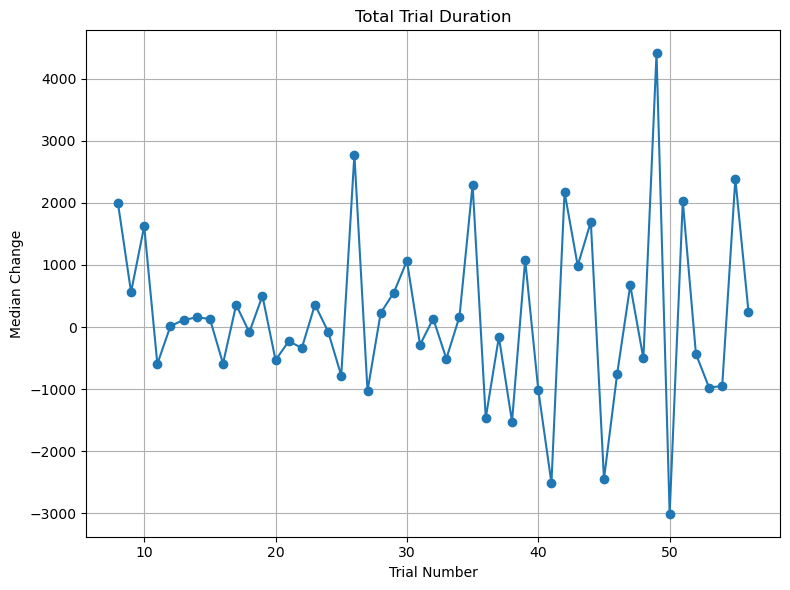

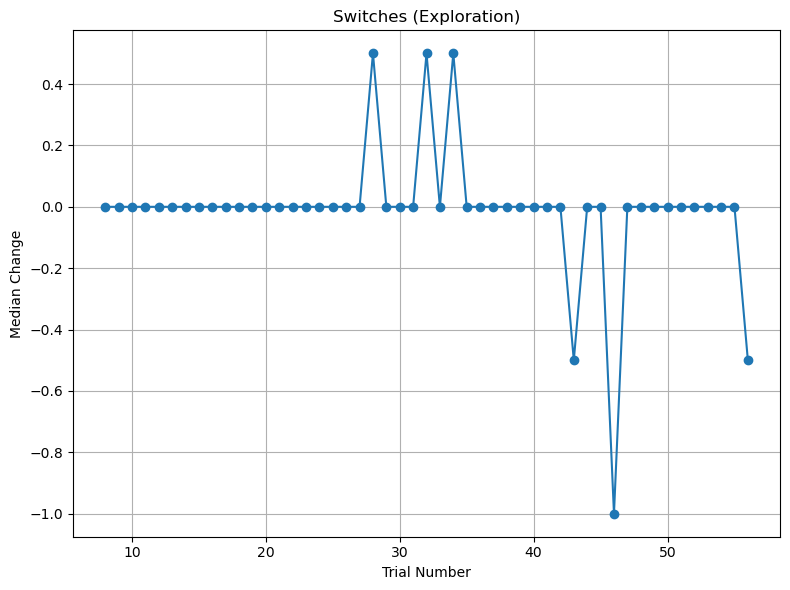

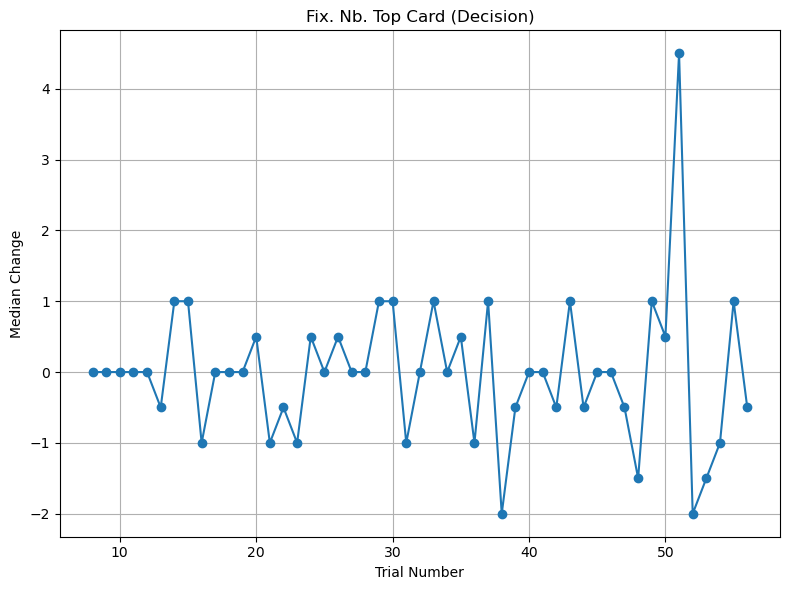

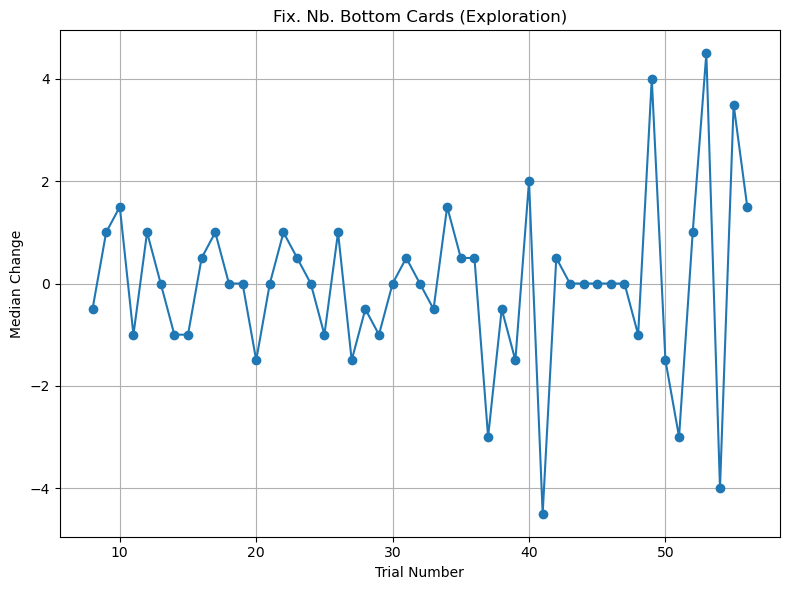

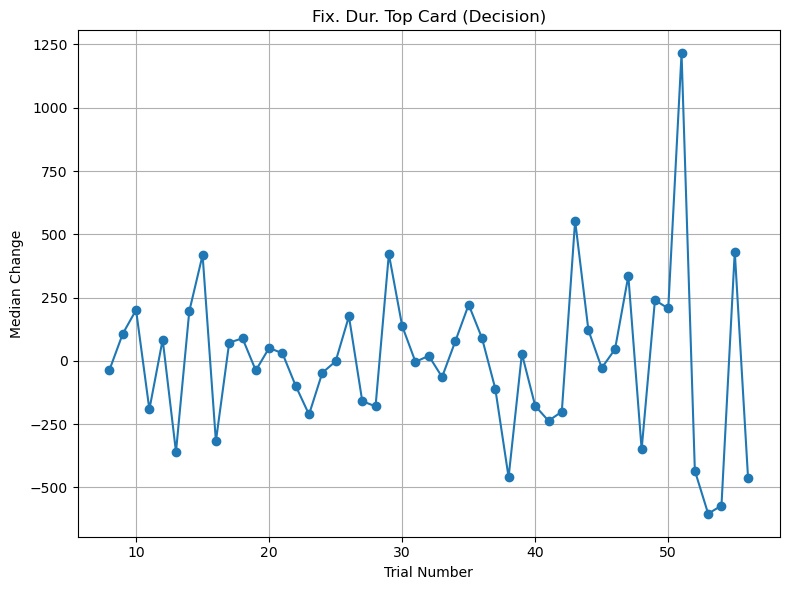

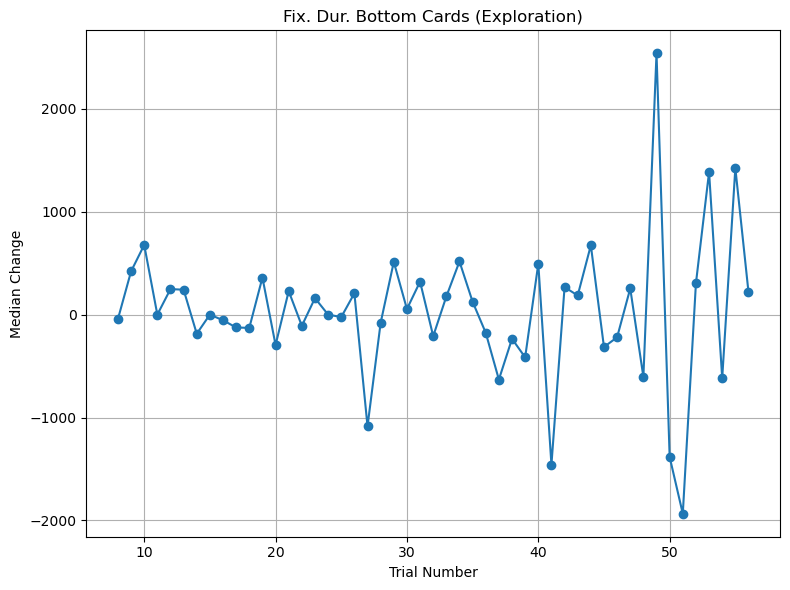

In [83]:
#Progression of change over trials per variable

variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNbInTDecision', 
    'FixNbInBottomExploration',
    'FixDurInTDecision', 
    'durfixBottomExploration'
]

titles = [
    'Exploration Period Duration',
    'Decision Period Duration',
    'Total Trial Duration',
    'Switches (Exploration)',
    'Fix. Nb. Top Card (Decision)',
    'Fix. Nb. Bottom Cards (Exploration)',
    'Fix. Dur. Top Card (Decision)',
    'Fix. Dur. Bottom Cards (Exploration)'
]

# Calculate change for each variable
for variable in variables:
    # Compute change for the current variable in each session
    merged_filtered_data[f'{variable}_change'] = merged_filtered_data.groupby('session')[variable].diff()

# Group changes by trial number and calculate the median change for each trial number
median_changes_per_trial = merged_filtered_data.groupby('trialno')[[f'{variable}_change' for variable in variables]].median()

for i, variable in enumerate(variables):
    plt.figure(figsize=(8, 6))  # Adjust figsize as needed
    plt.plot(median_changes_per_trial.index[:50], median_changes_per_trial[f'{variable}_change'][:50], marker='o')
    plt.title(titles[i])
    plt.xlabel('Trial Number')
    plt.ylabel('Median Change')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

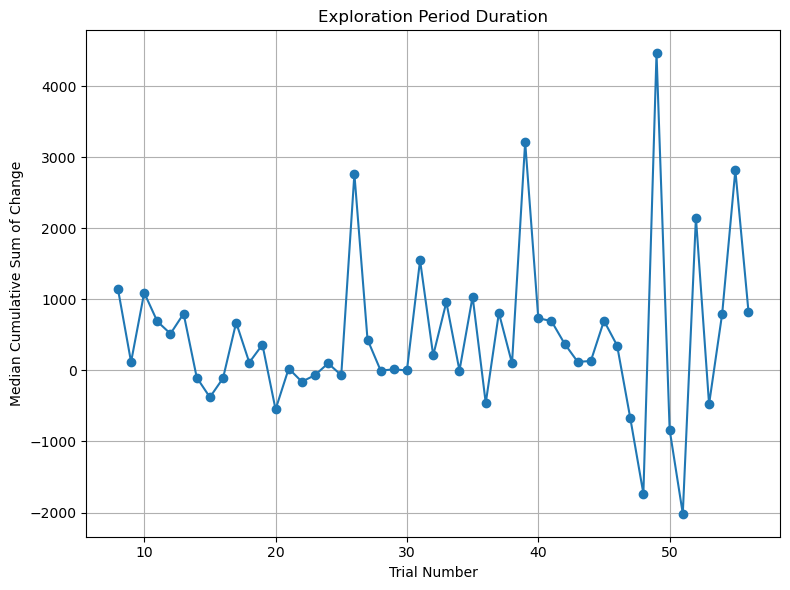

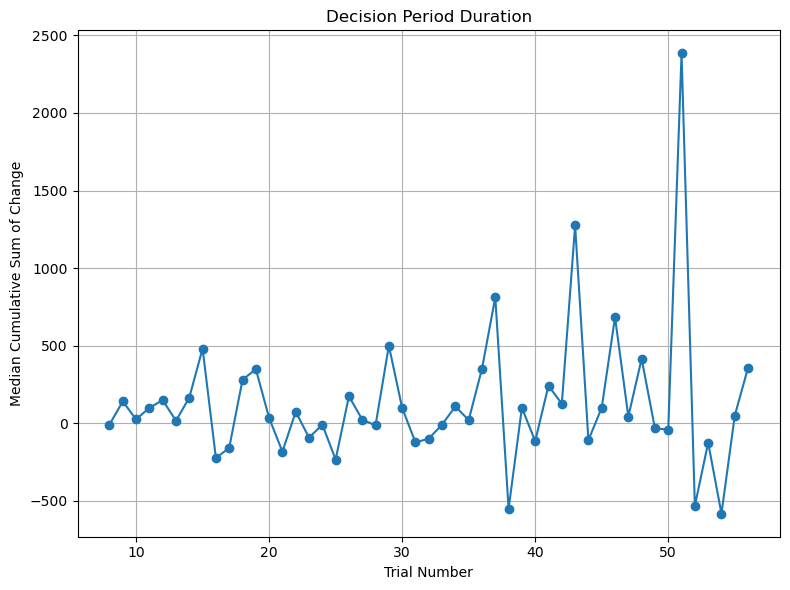

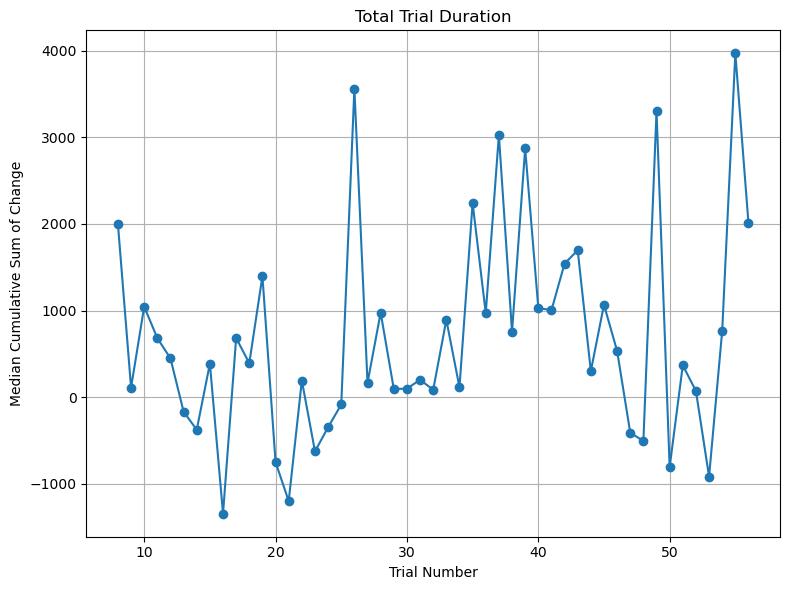

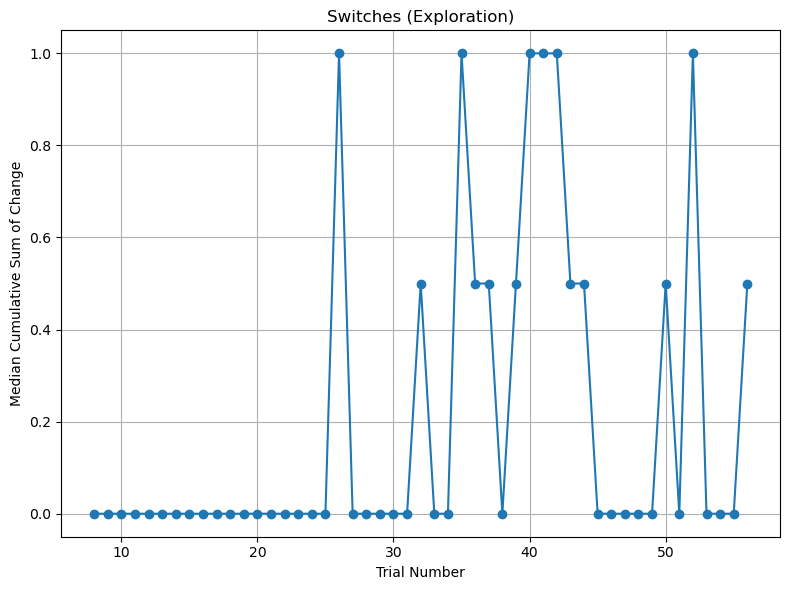

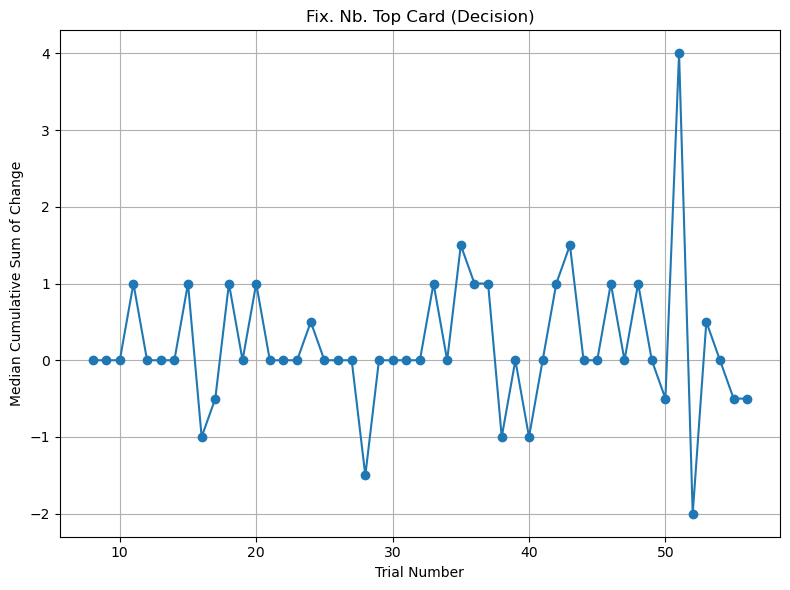

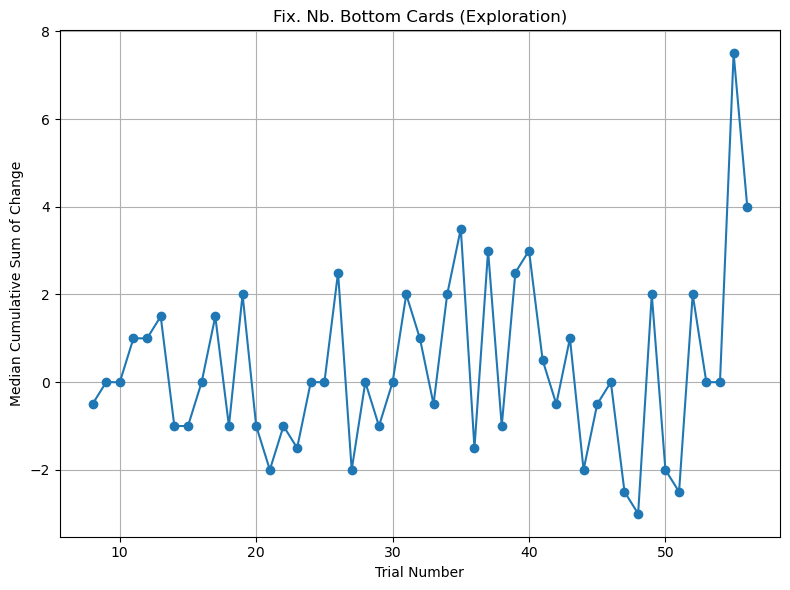

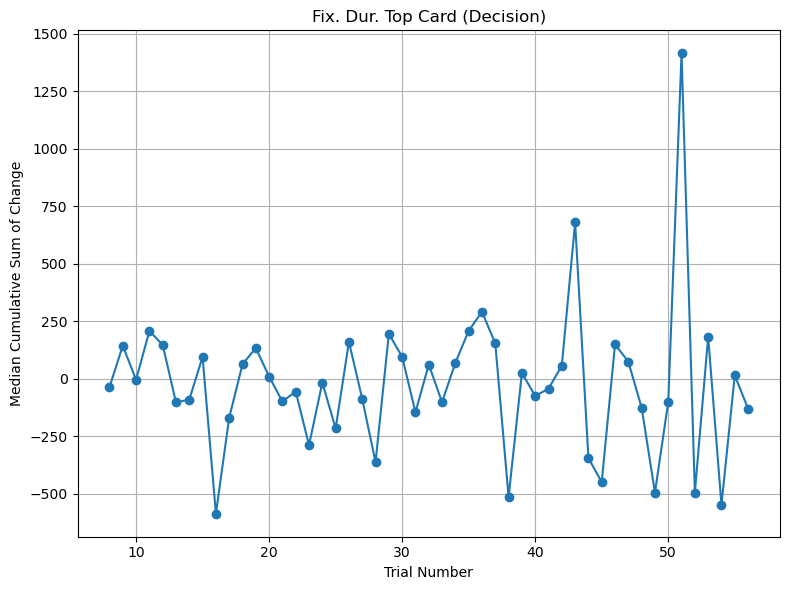

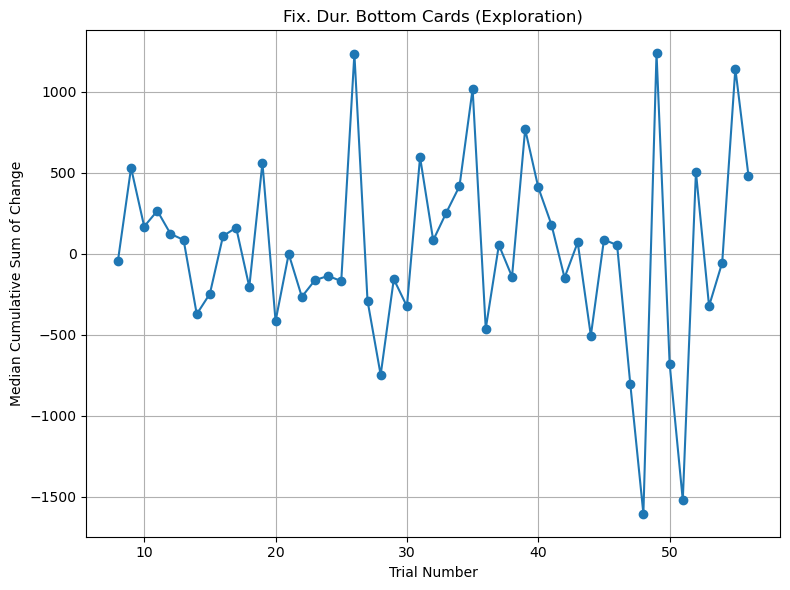

In [82]:
# Cumulative sum of change per session for each variable
cumulative_sum_per_session = {}

for variable in variables:
    cumulative_sum_per_session[variable] = merged_filtered_data.groupby('session')[f'{variable}_change'].cumsum()

# Median of cumulative sums for each variable
median_cumulative_sum_per_variable = pd.DataFrame({variable: cumulative_sum_per_session[variable].groupby(merged_filtered_data['trialno']).median() for variable in variables})

for i, variable in enumerate(variables, start=1):
    plt.figure(figsize=(8, 6))
    plt.plot(median_cumulative_sum_per_variable.index[:50], median_cumulative_sum_per_variable[variable][:50], marker='o')
    plt.title(titles[i-1])
    plt.xlabel('Trial Number')
    plt.ylabel('Median Cumulative Sum of Change')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

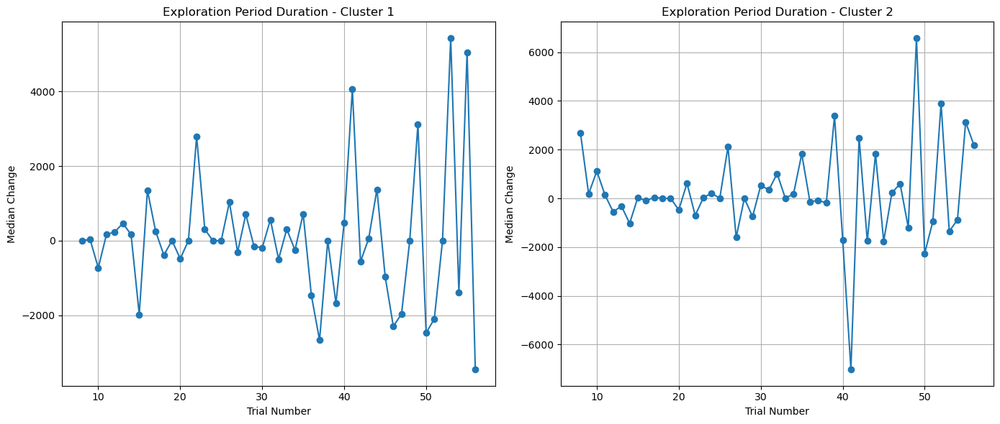

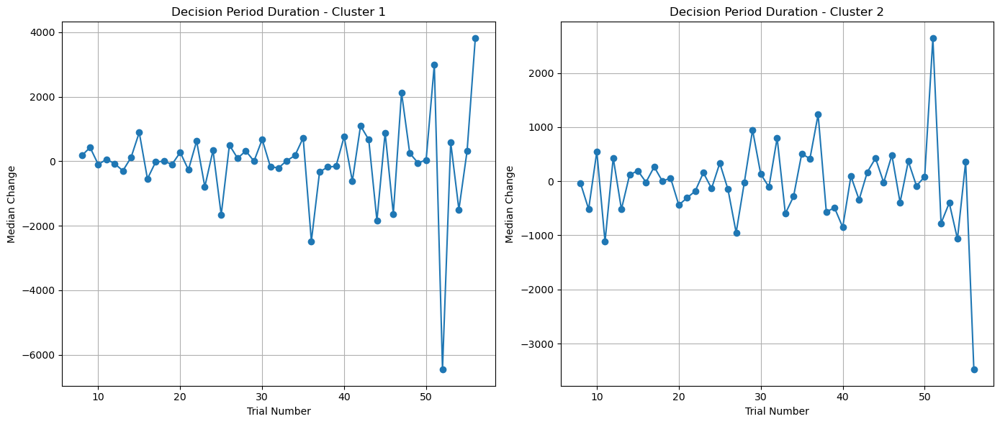

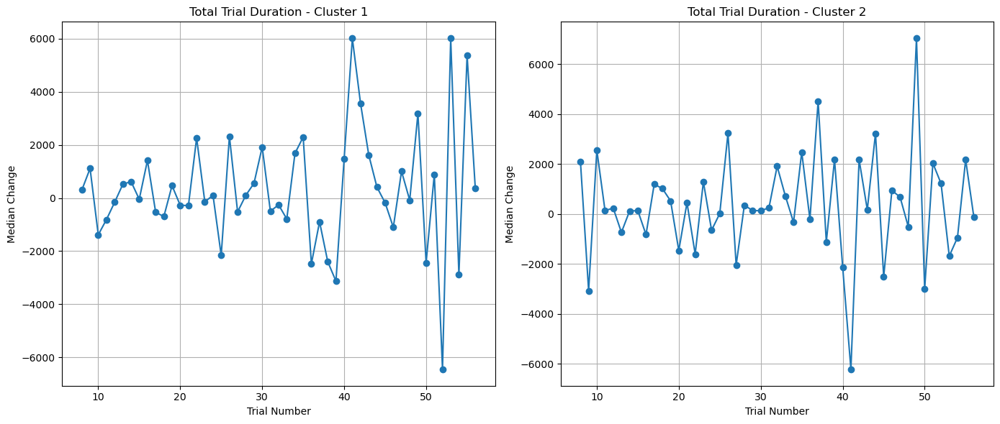

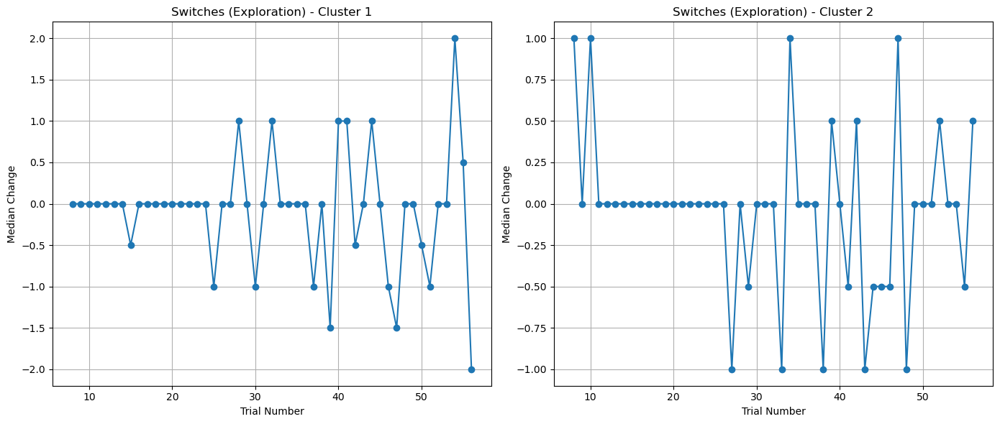

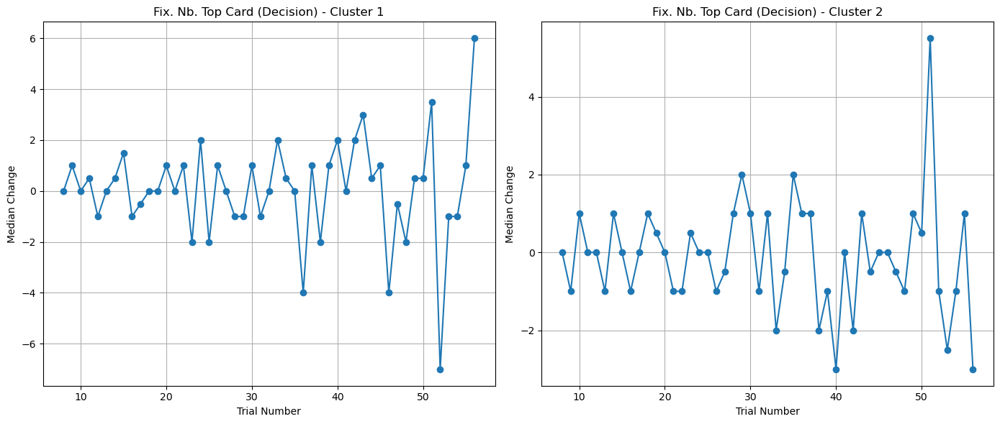

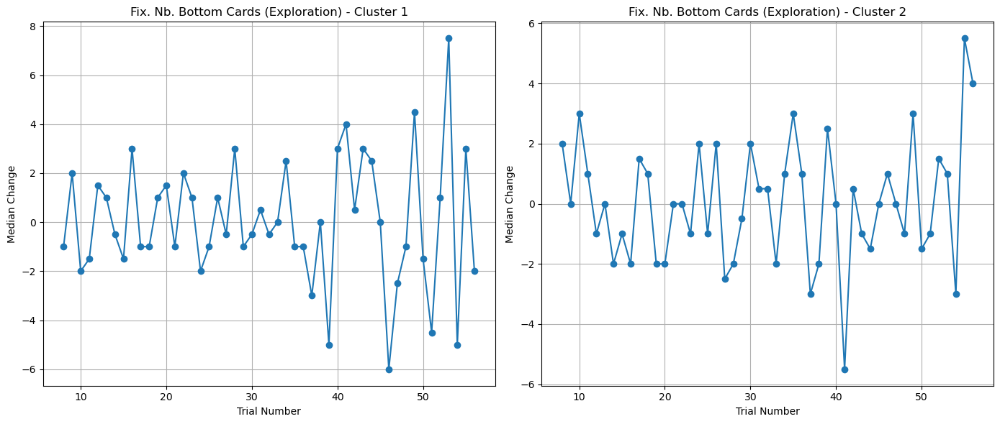

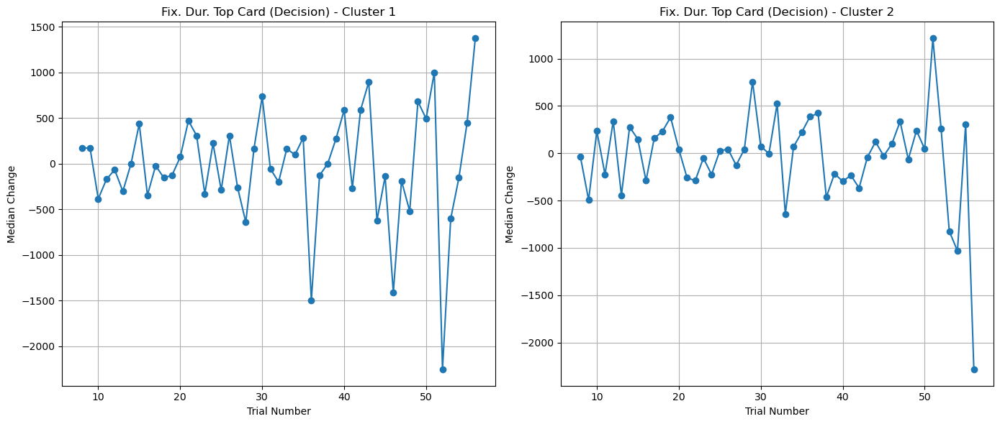

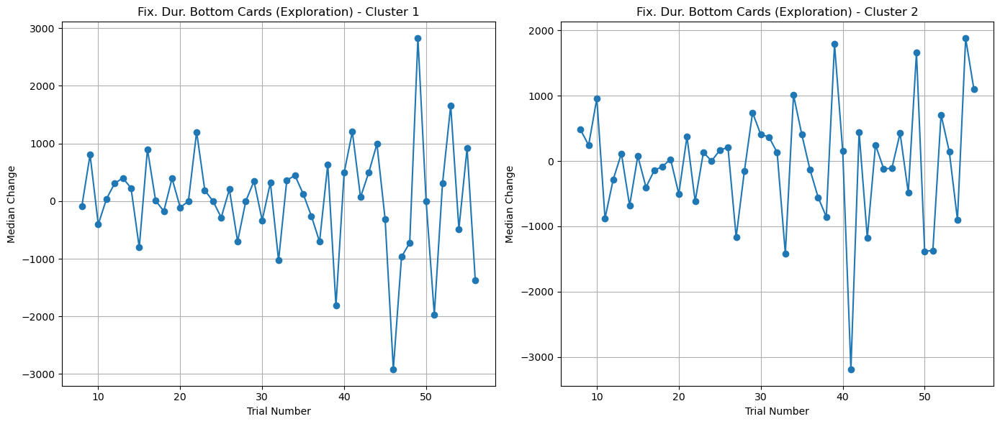

In [84]:
#Progression of change over trials per variable - clusters

# List of variables
variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNbInTDecision', 
    'FixNbInBottomExploration',
    'FixDurInTDecision', 
    'durfixBottomExploration'
]

# Titles for each variable
titles = [
    'Exploration Period Duration',
    'Decision Period Duration',
    'Total Trial Duration',
    'Switches (Exploration)',
    'Fix. Nb. Top Card (Decision)',
    'Fix. Nb. Bottom Cards (Exploration)',
    'Fix. Dur. Top Card (Decision)',
    'Fix. Dur. Bottom Cards (Exploration)'
]

# Calculate change for each variable
for variable in variables:
    # Compute change for the current variable in each session
    merged_filtered_data[f'{variable}_change'] = merged_filtered_data.groupby('session')[variable].diff()

# Group changes by trial number and calculate the median change for each trial number
median_changes_per_trial = merged_filtered_data.groupby('trialno')[[f'{variable}_change' for variable in variables]].median()

# Cluster data
cluster1 = [
    'curE002a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE019a', 'curE027a', 'curE030a', 'curE032a',
    'curE038a', 'curE039a', 'curE041a', 'curE045a', 'curE048a', 'curE049a', 'curE052a', 'curE063a', 'curE066a',
    'curE067a', 'curE072a', 'curE075a', 'curE084a', 'curE086a', 'curE094a', 'curE106a', 'curE108a', 'curE109a',
    'curE113a', 'curE114a', 'curE115a', 'curE118a', 'curE119a', 'curE121a', 'curE122a'
]

cluster2 = [
    'curE003a', 'curE004a', 'curE008a', 'curE009a', 'curE013a', 'curE014a', 'curE020a', 'curE024a', 'curE034a',
    'curE040a', 'curE043a', 'curE046a', 'curE050a', 'curE051a', 'curE053a', 'curE054a', 'curE055a', 'curE056a',
    'curE058a', 'curE062a', 'curE064a', 'curE069a', 'curE070a', 'curE071a', 'curE074a', 'curE076a', 'curE078a',
    'curE079a', 'curE080a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE099a', 'curE100a', 'curE104a',
    'curE107a', 'curE111a', 'curE112a', 'curE120a'
]

# Plotting each variable separately up to trial 50 for each cluster
for i, variable in enumerate(variables):
    plt.figure(figsize=(14, 6))  # Adjust figsize as needed

    # Plot for cluster 1
    plt.subplot(1, 2, 1)
    cluster1_data = merged_filtered_data[merged_filtered_data['session'].isin(cluster1)]
    cluster1_median_changes_per_trial = cluster1_data.groupby('trialno')[f'{variable}_change'].median()
    plt.plot(cluster1_median_changes_per_trial.index[:50], cluster1_median_changes_per_trial[:50], marker='o')
    plt.title(f'{titles[i]} - Cluster 1')
    plt.xlabel('Trial Number')
    plt.ylabel('Median Change')
    plt.grid(True)

    # Plot for cluster 2
    plt.subplot(1, 2, 2)
    cluster2_data = merged_filtered_data[merged_filtered_data['session'].isin(cluster2)]
    cluster2_median_changes_per_trial = cluster2_data.groupby('trialno')[f'{variable}_change'].median()
    plt.plot(cluster2_median_changes_per_trial.index[:50], cluster2_median_changes_per_trial[:50], marker='o')
    plt.title(f'{titles[i]} - Cluster 2')
    plt.xlabel('Trial Number')
    plt.ylabel('Median Change')
    plt.grid(True)

    plt.tight_layout()

    plt.show()

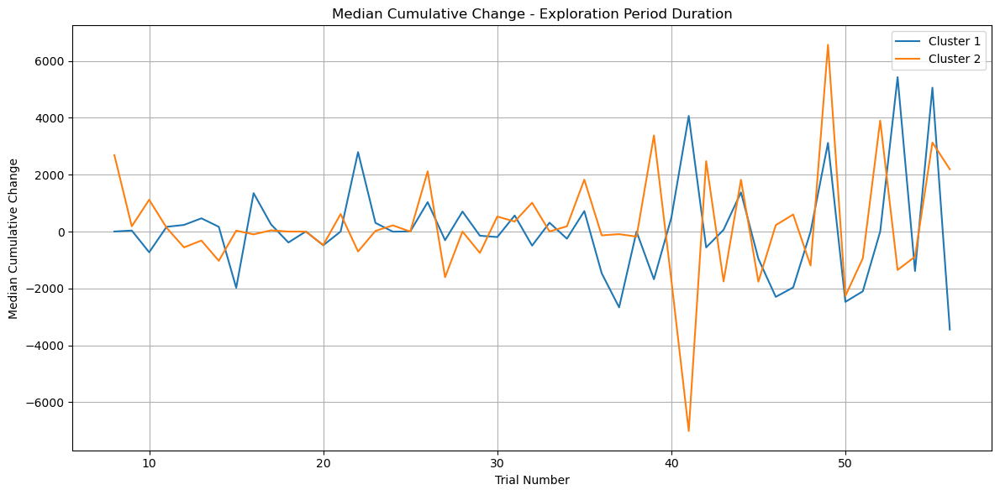

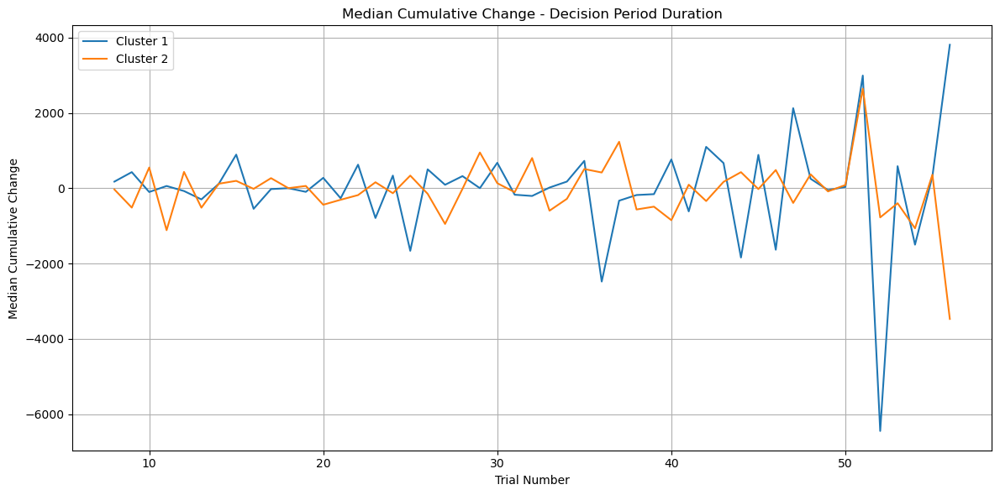

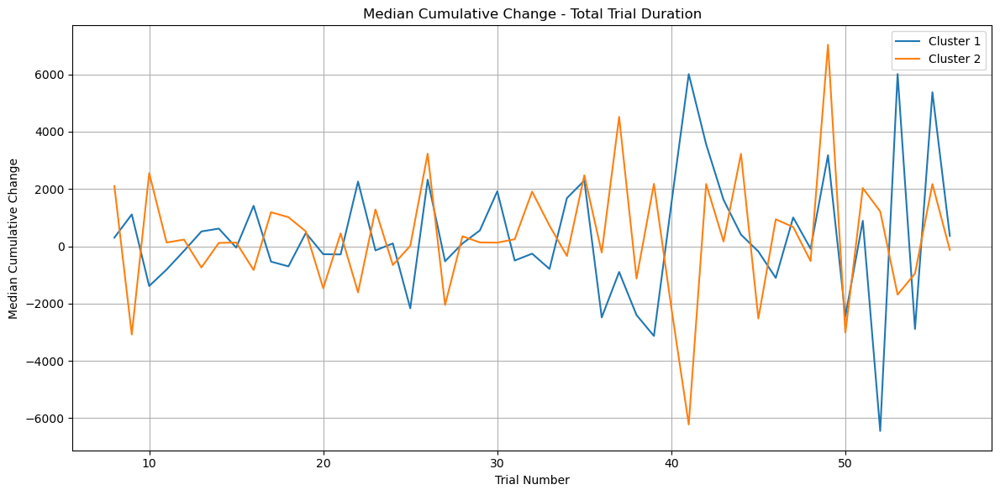

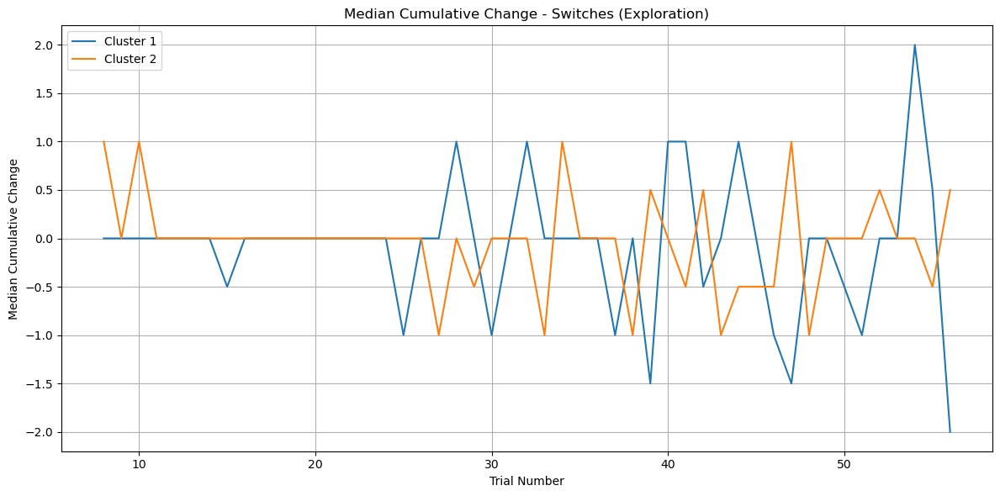

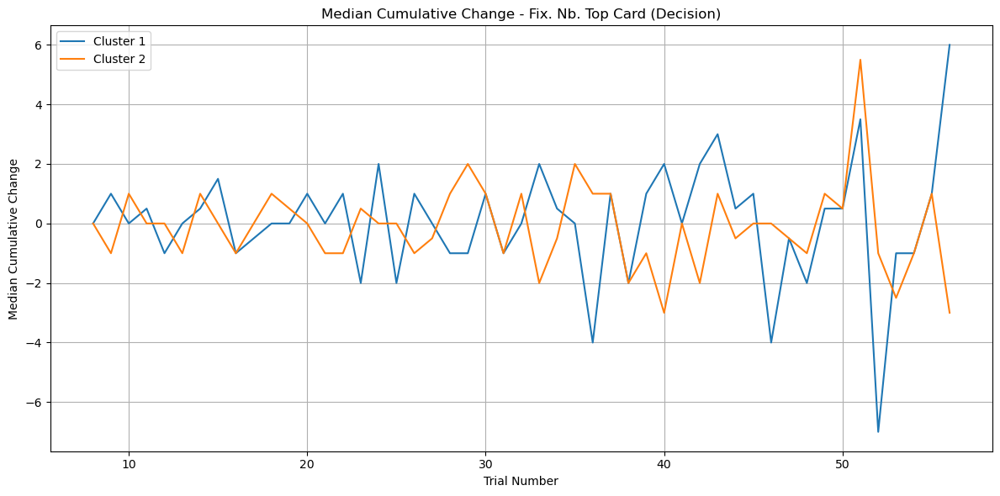

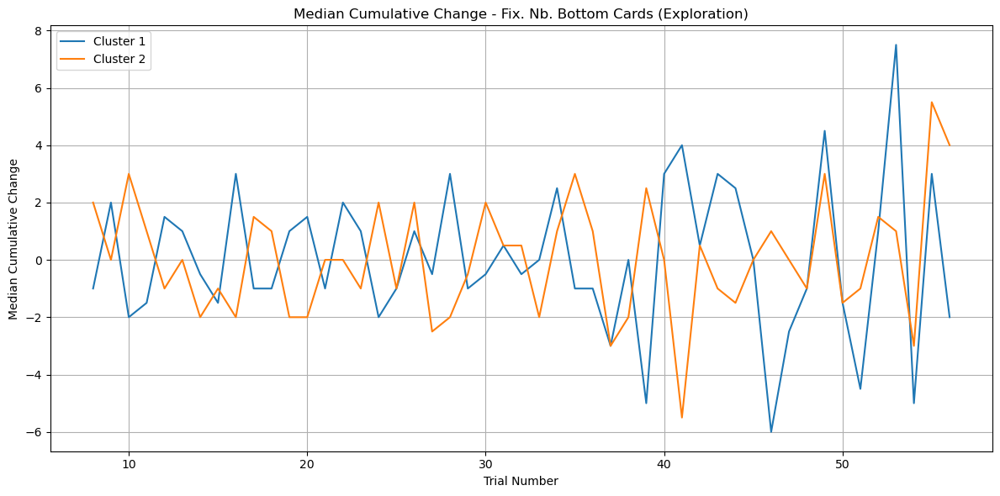

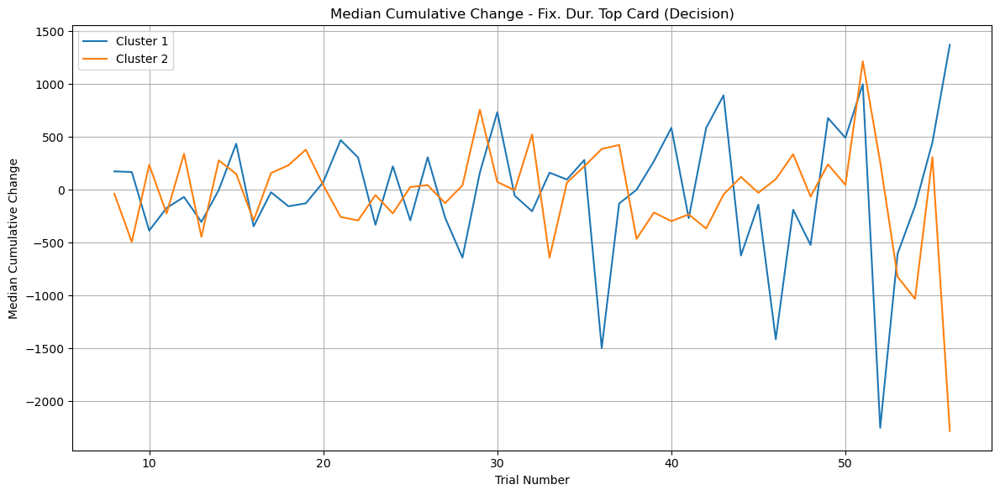

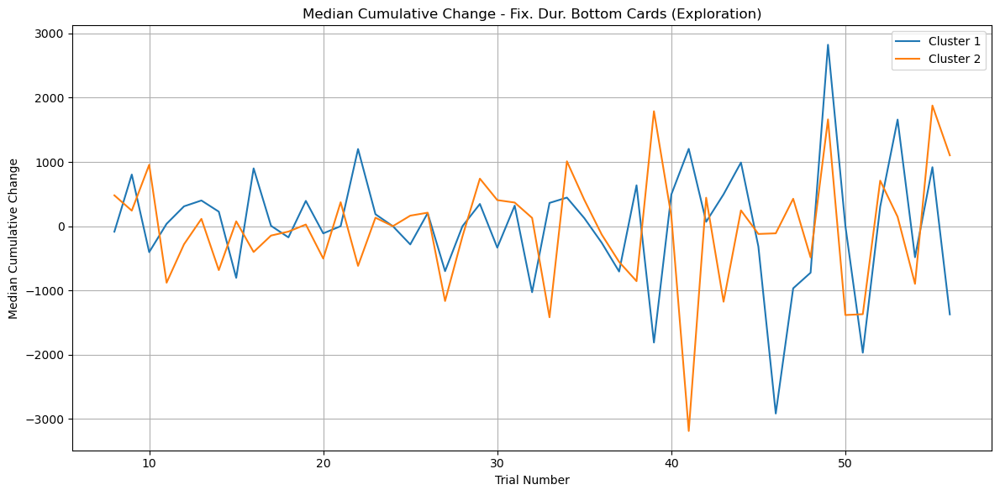

In [119]:
# Compute cumulative change for each variable per session and trial
cumulative_change_per_session = {}
for variable in variables:
    merged_filtered_data[f'{variable}_cumulative_change'] = merged_filtered_data.groupby(['session', 'trialno'])[f'{variable}_change'].cumsum()

# Compute median of cumulative change per trial number for each cluster
median_cumulative_change_per_trial_cluster = {}
for cluster_name, cluster in zip(['Cluster 1', 'Cluster 2'], [cluster1, cluster2]):
    cluster_data = merged_filtered_data[merged_filtered_data['session'].isin(cluster)]
    median_cumulative_change_per_trial_cluster[cluster_name] = cluster_data.groupby('trialno')[[f'{variable}_cumulative_change' for variable in variables]].median()

# Plot two plots per variable, one for each cluster, up to trial 50
for variable in variables:
    plt.figure(figsize=(12, 6))

    for cluster_name, median_cumulative_change_per_trial in median_cumulative_change_per_trial_cluster.items():
        plt.plot(median_cumulative_change_per_trial.index[:50], median_cumulative_change_per_trial[f'{variable}_cumulative_change'][:50], label=cluster_name)

    plt.title(f'Median Cumulative Change - {titles[variables.index(variable)]}')
    plt.xlabel('Trial Number')
    plt.ylabel('Median Cumulative Change')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [93]:
# Statistical tests
for variable in variables:
    # Drop NaN values
    cluster_data_cleaned = {cluster_name: cluster_data.dropna() for cluster_name, cluster_data in median_cumulative_change_per_trial_cluster.items()}
    
    for cluster_name, cluster_data in cluster_data_cleaned.items():
        # Shapiro-Wilk test for normality
        stat, p = shapiro(cluster_data[f'{variable}_change'])
        print(f'Shapiro-Wilk test for {cluster_name}, Variable: {variable}')
        print('Statistics=%.3f, p=%.3f' % (stat, p))
        # Interpret the result
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')

    # Levene's test for homogeneity of variances
    stat, p = levene(*[cluster_data[f'{variable}_change'] for cluster_data in cluster_data_cleaned.values()])
    print(f'Levene\'s test for {variable}')
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # Interpret the result
    alpha = 0.05
    if p > alpha:
        print('Variances are equal (fail to reject H0)')
    else:
        print('Variances are not equal (reject H0)')

    # Kruskal-Wallis test for group comparison
    stat, p = kruskal(*[cluster_data[f'{variable}_change'] for cluster_data in cluster_data_cleaned.values()])
    print(f'Kruskal-Wallis test for {variable}')
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # Interpret the result
    alpha = 0.05
    if p > alpha:
        print('Same distributions (fail to reject H0)')
    else:
        print('Different distributions (reject H0)')

Shapiro-Wilk test for Cluster 1, Variable: durExplorationPeriod
Statistics=0.856, p=0.000
Sample does not look Gaussian (reject H0)
Shapiro-Wilk test for Cluster 2, Variable: durExplorationPeriod
Statistics=0.782, p=0.000
Sample does not look Gaussian (reject H0)
Levene's test for durExplorationPeriod
Statistics=3.074, p=0.082
Variances are equal (fail to reject H0)
Kruskal-Wallis test for durExplorationPeriod
Statistics=0.037, p=0.848
Same distributions (fail to reject H0)
Shapiro-Wilk test for Cluster 1, Variable: durDecisionPeriod
Statistics=0.803, p=0.000
Sample does not look Gaussian (reject H0)
Shapiro-Wilk test for Cluster 2, Variable: durDecisionPeriod
Statistics=0.592, p=0.000
Sample does not look Gaussian (reject H0)
Levene's test for durDecisionPeriod
Statistics=5.479, p=0.021
Variances are not equal (reject H0)
Kruskal-Wallis test for durDecisionPeriod
Statistics=0.448, p=0.504
Same distributions (fail to reject H0)
Shapiro-Wilk test for Cluster 1, Variable: durPeriodTotal


Correlations for 'durExplorationPeriod':


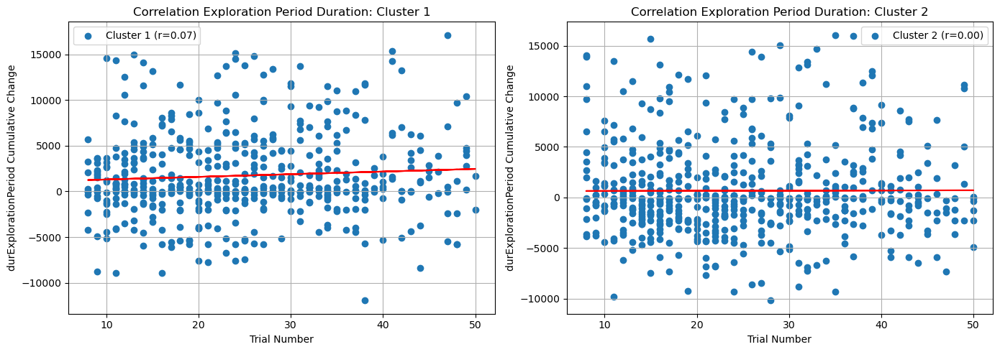


Correlations for 'durDecisionPeriod':


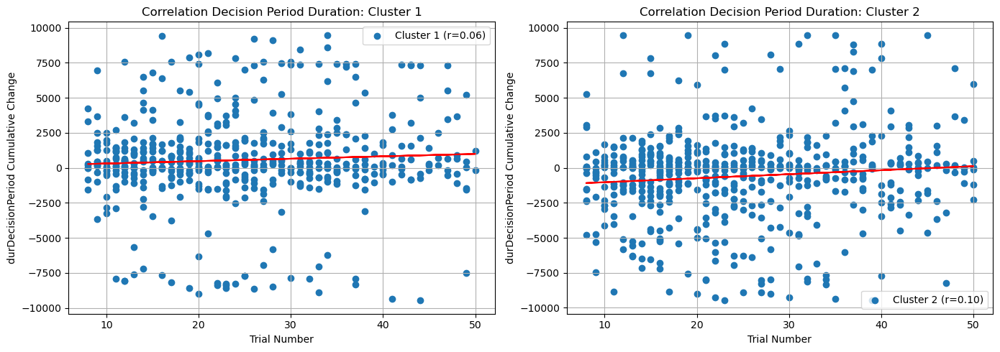


Correlations for 'durPeriodTotal':


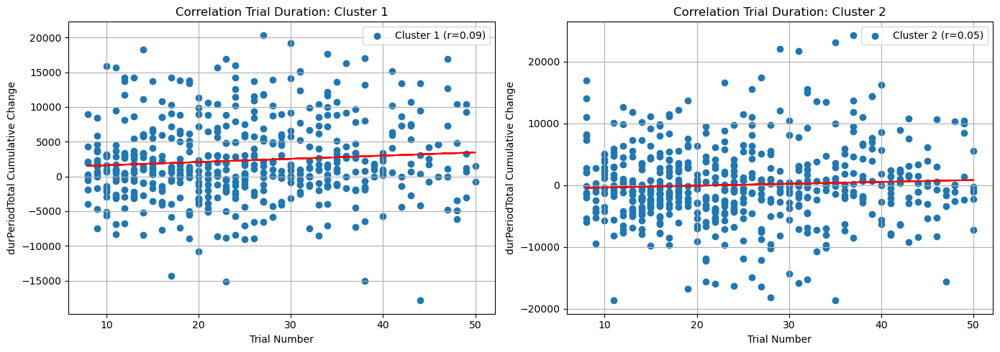


Correlations for 'SwitchesExplorationPeriod':


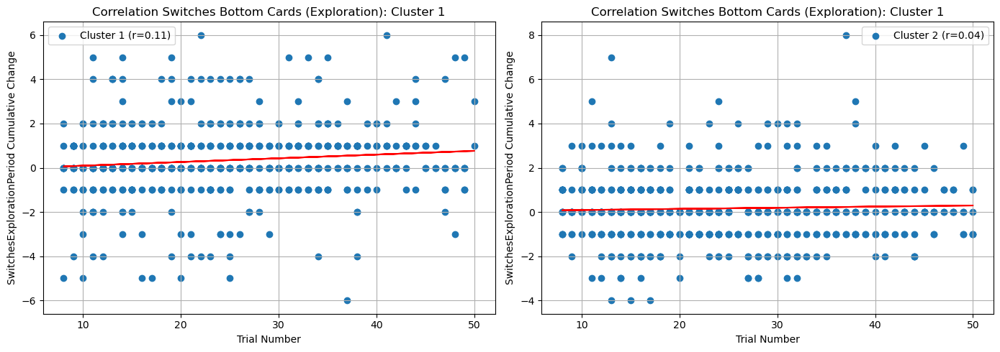


Correlations for 'FixNbInTDecision':


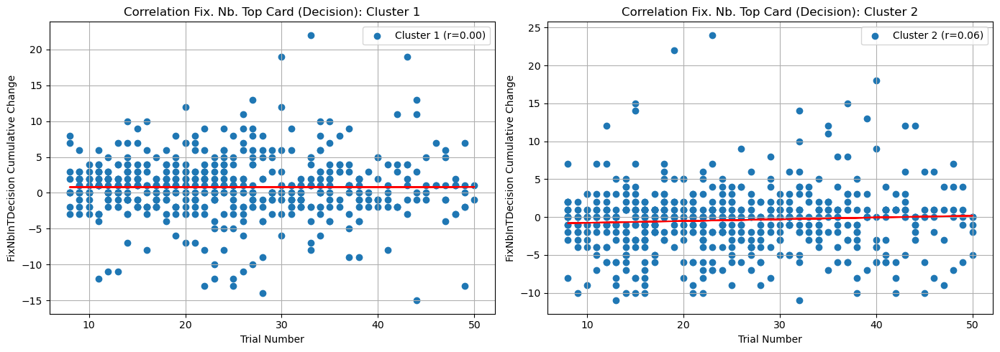


Correlations for 'FixNbInBottomExploration':


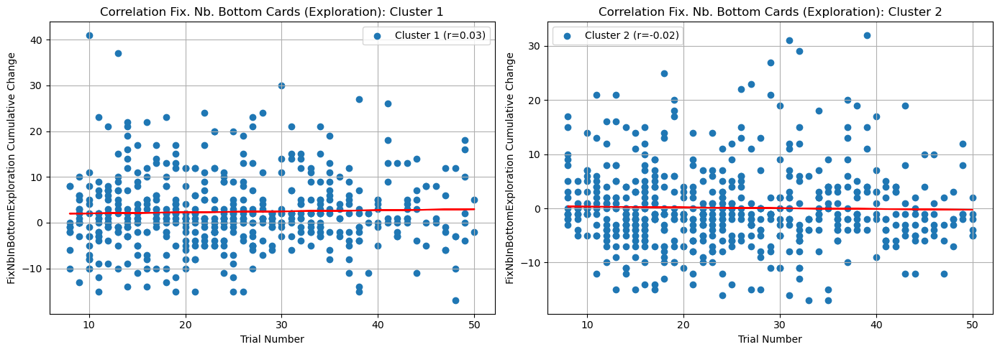


Correlations for 'FixDurInTDecision':


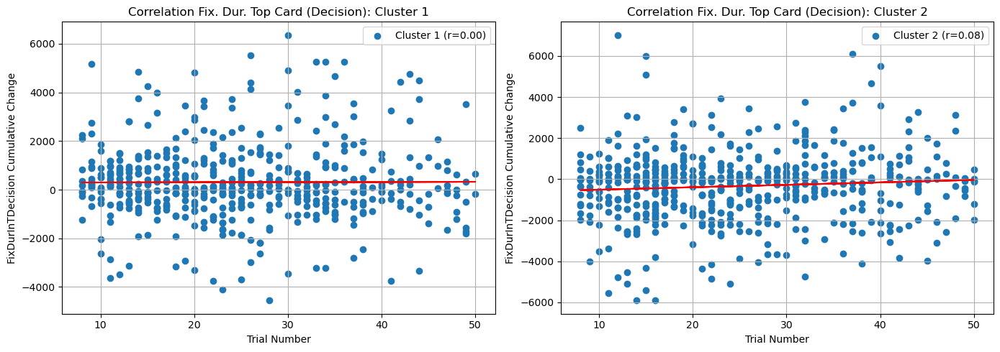


Correlations for 'durfixBottomExploration':


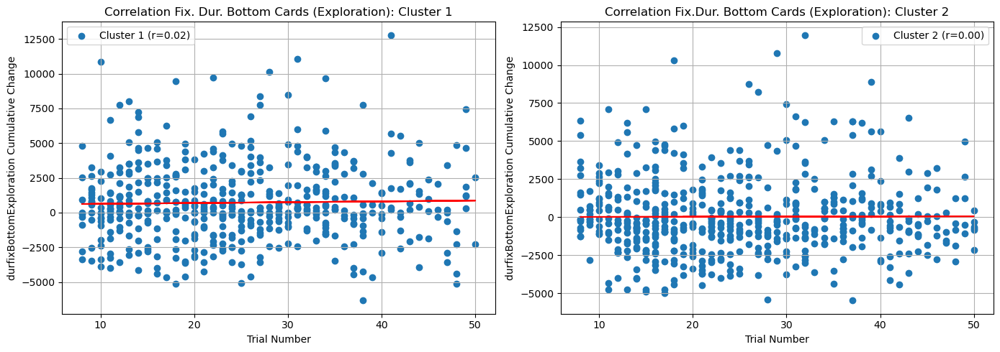

In [86]:
# Correlation cumulative sum of changes - Pearson Correlation Coefficients
plot_titles = [
    "Correlation Exploration Period Duration: Cluster 1",
    "Correlation Exploration Period Duration: Cluster 2",
    "Correlation Decision Period Duration: Cluster 1",
    "Correlation Decision Period Duration: Cluster 2",
    "Correlation Trial Duration: Cluster 1",
    "Correlation Trial Duration: Cluster 2",
    "Correlation Switches Bottom Cards (Exploration): Cluster 1",
    "Correlation Switches Bottom Cards (Exploration): Cluster 1",
    "Correlation Fix. Nb. Top Card (Decision): Cluster 1",
    "Correlation Fix. Nb. Top Card (Decision): Cluster 2",
    "Correlation Fix. Nb. Bottom Cards (Exploration): Cluster 1",
    "Correlation Fix. Nb. Bottom Cards (Exploration): Cluster 2",
    "Correlation Fix. Dur. Top Card (Decision): Cluster 1",
    "Correlation Fix. Dur. Top Card (Decision): Cluster 2", 
    "Correlation Fix. Dur. Bottom Cards (Exploration): Cluster 1",
    "Correlation Fix.Dur. Bottom Cards (Exploration): Cluster 2",
]

def plot_correlation_with_line(ax, x, y, variable, cluster_name, title):
    correlation = np.corrcoef(x, y)[0, 1]
    ax.scatter(x, y, label=f'{cluster_name} (r={correlation:.2f})')
    m, b = np.polyfit(x, y, 1) 
    ax.plot(x, m * x + b, color='red')
    ax.set_xlabel('Trial Number')
    ax.set_ylabel(f'{variable} Cumulative Change')
    ax.set_title(title)  
    ax.legend()
    ax.grid(True)
    return correlation

for variable in variables:
    print(f"Correlations for '{variable}':")
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # Create subplots with 1 row and 2 columns
    for idx, (cluster_name, cluster) in enumerate([('Cluster 1', cluster1), ('Cluster 2', cluster2)]):
        cluster_data = merged_filtered_data[merged_filtered_data['session'].isin(cluster)]
        grouped_data = cluster_data.groupby(['session', 'trialno'])[f'{variable}_change'].median().reset_index()
        grouped_data = grouped_data.dropna()
        grouped_data = grouped_data[grouped_data['trialno'] <= 50]
        
        # Calculate cumulative sum
        grouped_data[f'{variable}_cumulative'] = grouped_data.groupby('session')[f'{variable}_change'].cumsum()
        
        x = grouped_data['trialno']
        y = grouped_data[f'{variable}_cumulative']
        
        correlation = plot_correlation_with_line(axes[idx], x, y, variable, cluster_name, plot_titles.pop(0))  
    plt.tight_layout()
    plt.show()
    print()
